# Analysis of simulated data

### Import dependencies

In [2]:
import matplotlib as mpl  
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import math
import importlib
import seaborn as sns
from collections import defaultdict
import sys
import importlib
from anndata import AnnData
import scanpy as sc
from statsmodels.stats.multitest import multipletests
import json
import os
from os.path import join

sys.path.append('/Users/matthewbernstein/Development/spatial-transcriptomics-simulator')
sys.path.append('/Users/matthewbernstein/Development/spatialcorr/')

from simulate_spatial import simulate_data
from simulate_spatial import normalize_deviance_residuals as ndr
import spatialcorr

DATA_ROOT = '/Users/matthewbernstein/Development/spatial_transcriptomics/simulate_data'

sns.set_palette("Set2")

### Utility functions

In [4]:
def build_adata_from_sim_dataframe(df, g1='dino_gene_1', g2='dino_gene_2'):
    return AnnData(
        X=np.array([
            df[g1], 
            df[g2]]
        ).T,
        obs=df,
        var=pd.DataFrame(
            index=['Gene 1', 'Gene 2'],
            data=['Gene 1', 'Gene 2']
        )
    )

### Results on CALML5 and CALML5 when covariance strength is zero

In [5]:
df_sim_sig_5_cs_0_0_spotwise = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-g_CALML5.CALML5_sf_spotwise_sigma_10_cs_0.0.tsv'),
    sep='\t', index_col=0
)

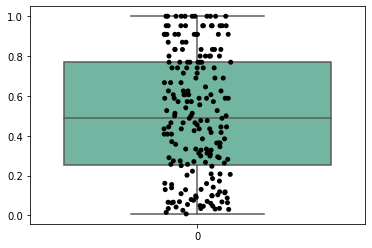

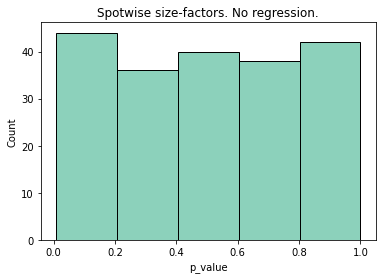

In [6]:
sns.boxplot(data=df_sim_sig_5_cs_0_0_spotwise['p_value'])
sns.stripplot(data=df_sim_sig_5_cs_0_0_spotwise['p_value'], color='black')
plt.show()

sns.histplot(df_sim_sig_5_cs_0_0_spotwise['p_value'], bins=5)
plt.title("Spotwise size-factors. No regression.")
plt.show()

Show data with spotwise size factors

Simulated data
--------------


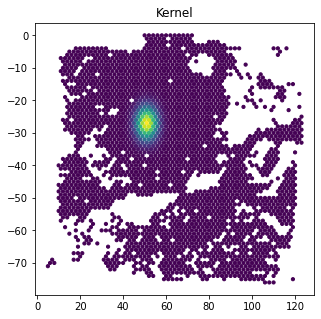

Counts


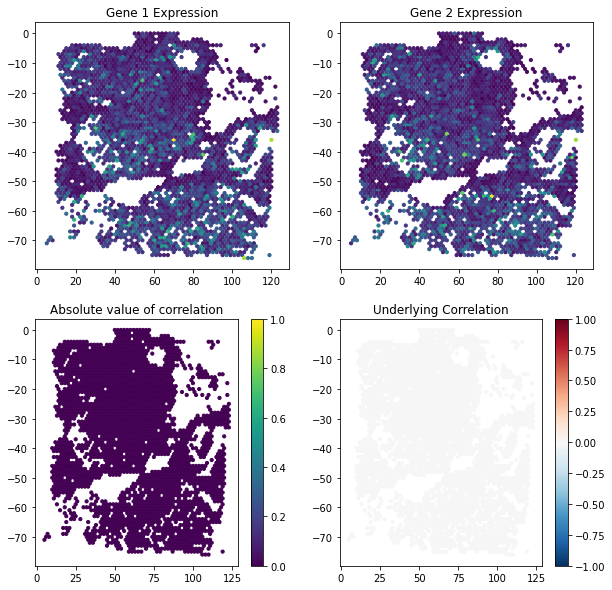

Deviance Residuals


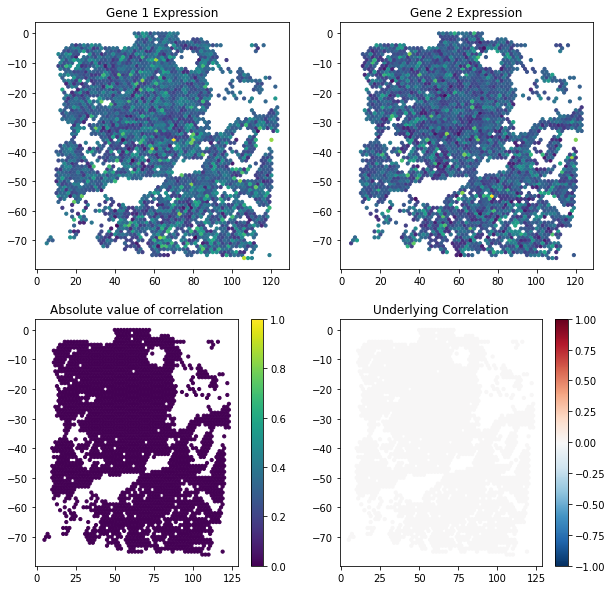

Dino


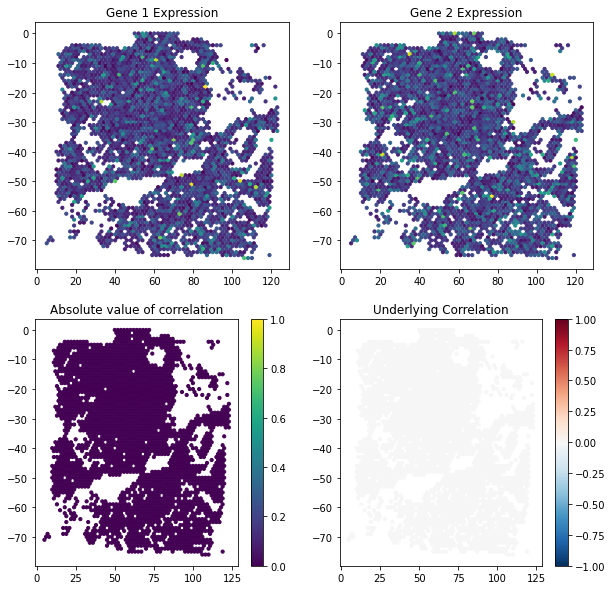

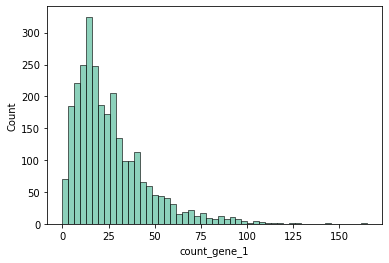

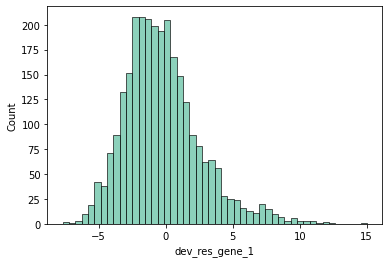

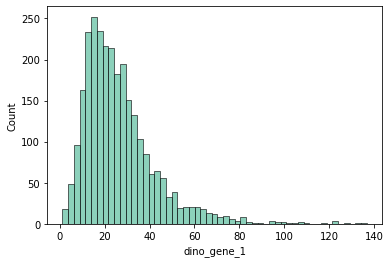

Examine effect of size-factors


/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


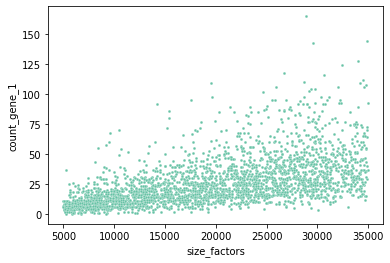

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


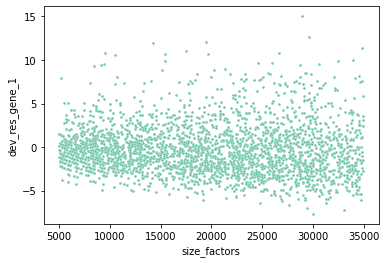

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


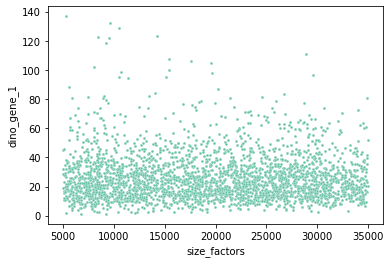

Experimental Data as a reference
--------------------------------


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/Users/matthewbernstein/Development/spatial-transcriptomics-simulator/simulate_spatial/normalize_deviance_residuals.py:36: RuntimeWarning: invalid value encountered in sqrt
  R = np.nan_to_num(np.sign(X - M) * np.sqrt(square), copy=True, nan=0.0)


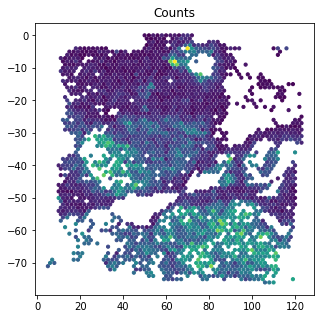

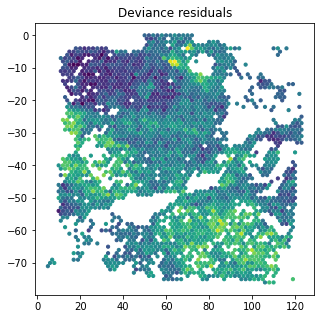

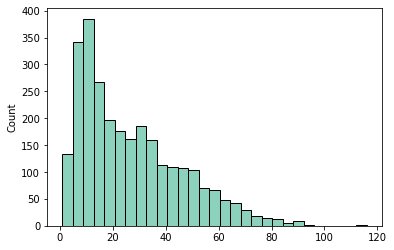

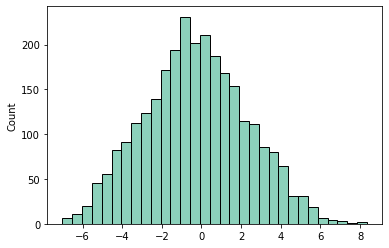

Examine effect of size-factors


/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


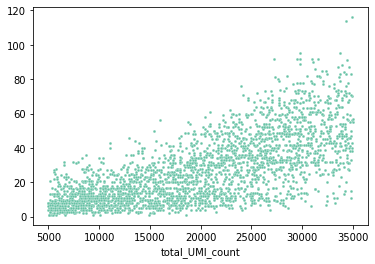

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


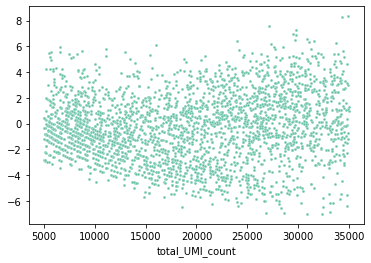

In [7]:
print("Simulated data")
print("--------------")

df_sim_data_cs_0_0_spotwise_CALML5 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_CALML5.CALML5_sigma_10_cs_0.0/0.tsv'),
    sep='\t', index_col=0
)

kernel_matrix = spatialcorr.statistical_test._compute_kernel_matrix(
    df_sim_data_cs_0_0_spotwise_CALML5,
    5,
    condition_on_cell_type=False,
    y_col='row',
    x_col='col'
)
spatialcorr.plot_slide(
    df_sim_data_cs_0_0_spotwise_CALML5, 
    kernel_matrix[1100], 
    cmap='viridis',
    colorbar=False,
    title='Kernel',
    row_key='row',
    col_key='col',
    dsize=10
)
plt.show()

print("Counts")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_0_spotwise_CALML5, 
    df_sim_data_cs_0_0_spotwise_CALML5['count_gene_1'], 
    df_sim_data_cs_0_0_spotwise_CALML5['count_gene_2'], 
    df_sim_data_cs_0_0_spotwise_CALML5['correlation'], 
    df_sim_data_cs_0_0_spotwise_CALML5['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Deviance Residuals")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_0_spotwise_CALML5, 
    df_sim_data_cs_0_0_spotwise_CALML5['dev_res_gene_1'], 
    df_sim_data_cs_0_0_spotwise_CALML5['dev_res_gene_2'], 
    df_sim_data_cs_0_0_spotwise_CALML5['correlation'], 
    df_sim_data_cs_0_0_spotwise_CALML5['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Dino")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_0_spotwise_CALML5, 
    df_sim_data_cs_0_0_spotwise_CALML5['dino_gene_1'], 
    df_sim_data_cs_0_0_spotwise_CALML5['dino_gene_2'], 
    df_sim_data_cs_0_0_spotwise_CALML5['correlation'], 
    df_sim_data_cs_0_0_spotwise_CALML5['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

sns.histplot(df_sim_data_cs_0_0_spotwise_CALML5['count_gene_1'])
plt.show()

sns.histplot(df_sim_data_cs_0_0_spotwise_CALML5['dev_res_gene_1'])
plt.show()

sns.histplot(df_sim_data_cs_0_0_spotwise_CALML5['dino_gene_1'])
plt.show()

print("Examine effect of size-factors")
sns.scatterplot(
    df_sim_data_cs_0_0_spotwise_CALML5['size_factors'],
    df_sim_data_cs_0_0_spotwise_CALML5['count_gene_1'],
    s=8
)
plt.show()

sns.scatterplot(
    df_sim_data_cs_0_0_spotwise_CALML5['size_factors'],
    df_sim_data_cs_0_0_spotwise_CALML5['dev_res_gene_1'],
    s=8
)
plt.show()

sns.scatterplot(
    df_sim_data_cs_0_0_spotwise_CALML5['size_factors'],
    df_sim_data_cs_0_0_spotwise_CALML5['dino_gene_1'],
    s=8
)
plt.show()

print("Experimental Data as a reference")
print("--------------------------------")

import ssl
ssl._create_default_https_context = ssl._create_unverified_context

adata_real = sc.datasets.visium_sge(sample_id="V1_Breast_Cancer_Block_A_Section_1")
adata_real.X = adata_real.X.todense()
adata_real.obs['total_UMI_count'] = np.sum(adata_real.X, axis=1)
sc.pp.filter_cells(adata_real, min_counts=5000)
sc.pp.filter_cells(adata_real, max_counts=35000)
X_real_res = ndr.normalize(
    np.array([
        adata_real.obs_vector('CALML5'),
        adata_real.obs_vector('CALML5')
    ]).T,
    umi_counts=adata_real.obs['total_UMI_count']
)

spatialcorr.plot_slide(
    adata_real.obs, 
    adata_real.obs_vector('CALML5'), 
    cmap='viridis',
    colorbar=False,
    title='Counts',
    row_key='array_row',
    col_key='array_col',
    dsize=10
)
plt.show()

spatialcorr.plot_slide(
    adata_real.obs, 
    X_real_res.T[0], 
    cmap='viridis',
    colorbar=False,
    title='Deviance residuals',
    row_key='array_row',
    col_key='array_col',
    dsize=10
)
plt.show()

sns.histplot(adata_real.obs_vector('CALML5'))
plt.show()

sns.histplot(X_real_res.T[0])
plt.show()

print("Examine effect of size-factors")
sns.scatterplot(
    adata_real.obs['total_UMI_count'],
    adata_real.obs_vector('CALML5'),
    s=8
)
plt.show()

sns.scatterplot(
    adata_real.obs['total_UMI_count'],
    X_real_res.T[0],
    s=8
)
plt.show()

### Results on PECAM1 and PECAM1 when covariance strength is zero

Simulated data
--------------
Counts


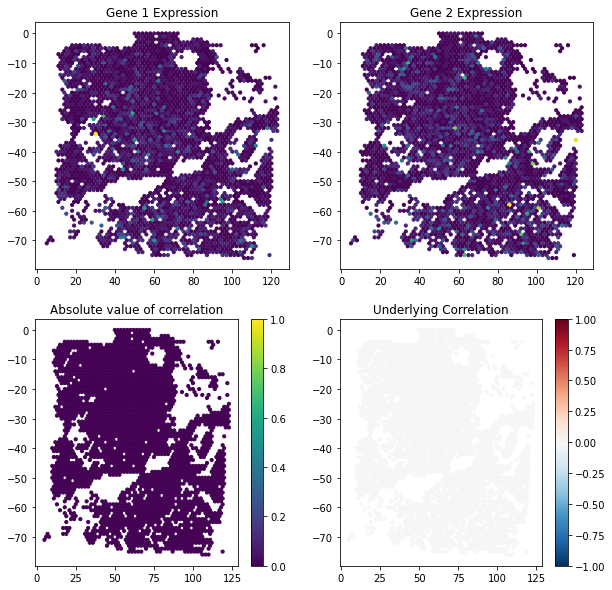

Deviance Residuals


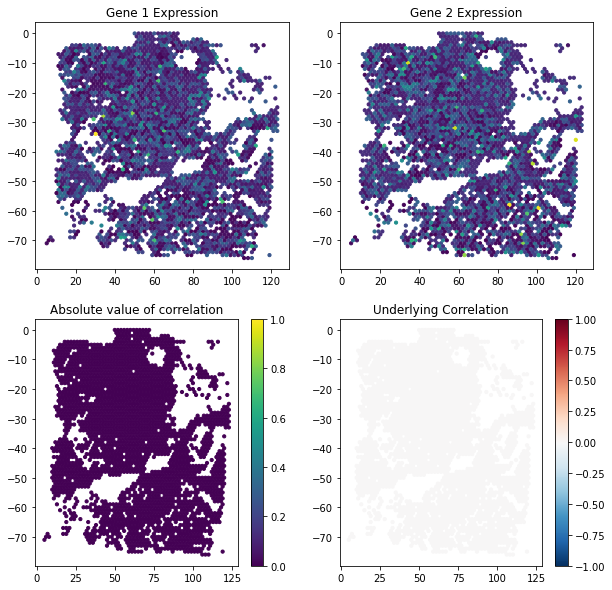

Dino


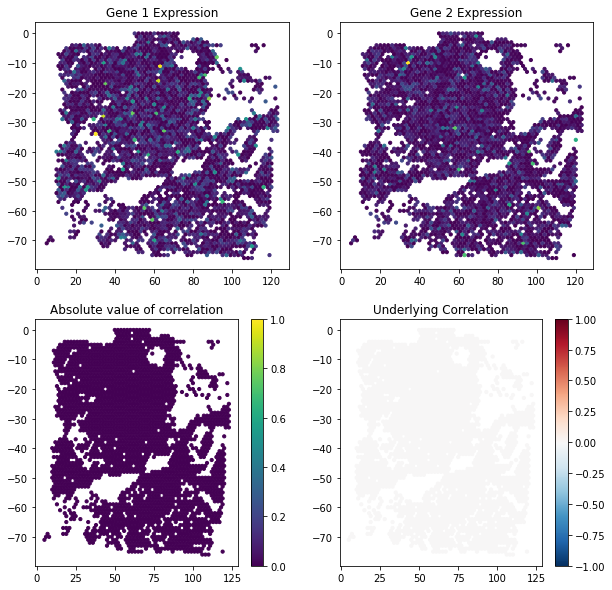

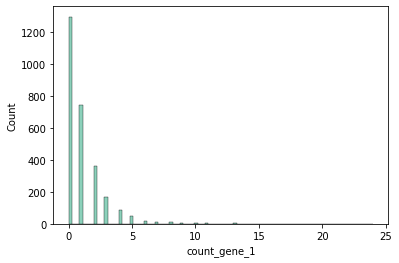

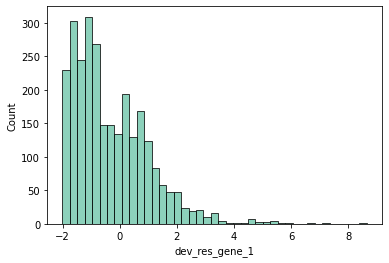

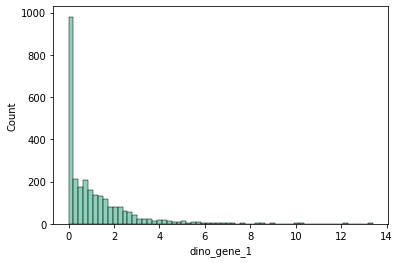

Examine effect of size-factors


/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


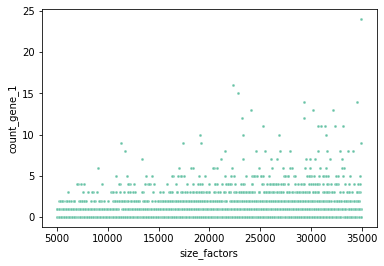

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


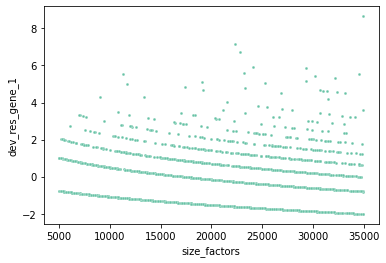

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


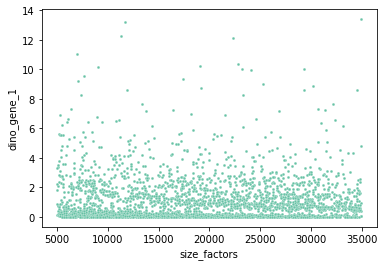

Experimental Data as a reference
--------------------------------


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/Users/matthewbernstein/Development/spatial-transcriptomics-simulator/simulate_spatial/normalize_deviance_residuals.py:28: RuntimeWarning: divide by zero encountered in log
  square = np.nan_to_num(2*X*np.log(X/M), copy=True, nan=0.0) \
/Users/matthewbernstein/Development/spatial-transcriptomics-simulator/simulate_spatial/normalize_deviance_residuals.py:28: RuntimeWarning: invalid value encountered in multiply
  square = np.nan_to_num(2*X*np.log(X/M), copy=True, nan=0.0) \
/Users/matthewbernstein/

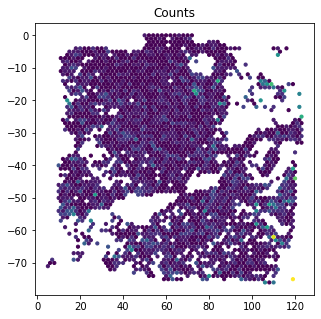

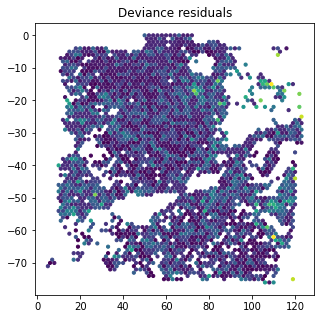

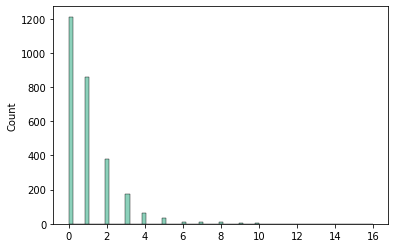

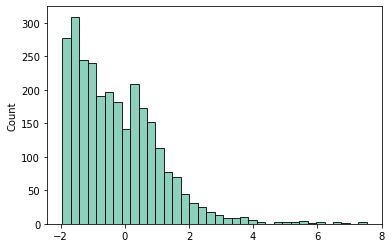

Examine effect of size-factors


/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


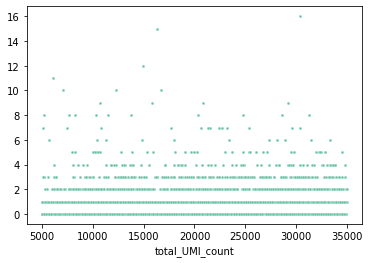

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


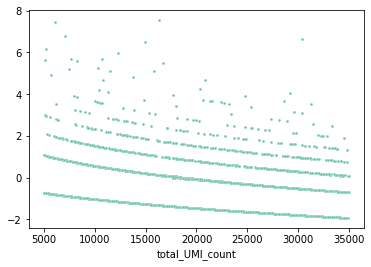

In [8]:
print("Simulated data")
print("--------------")

df_sim_data_cs_0_0_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_PECAM1.PECAM1_sigma_10_cs_0.0/0.tsv'),
    sep='\t', index_col=0
)

print("Counts")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_0_spotwise_PECAM1, 
    df_sim_data_cs_0_0_spotwise_PECAM1['count_gene_1'], 
    df_sim_data_cs_0_0_spotwise_PECAM1['count_gene_2'], 
    df_sim_data_cs_0_0_spotwise_PECAM1['correlation'], 
    df_sim_data_cs_0_0_spotwise_PECAM1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Deviance Residuals")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_0_spotwise_PECAM1, 
    df_sim_data_cs_0_0_spotwise_PECAM1['dev_res_gene_1'], 
    df_sim_data_cs_0_0_spotwise_PECAM1['dev_res_gene_2'], 
    df_sim_data_cs_0_0_spotwise_PECAM1['correlation'], 
    df_sim_data_cs_0_0_spotwise_PECAM1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Dino")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_0_spotwise_PECAM1, 
    df_sim_data_cs_0_0_spotwise_PECAM1['dino_gene_1'], 
    df_sim_data_cs_0_0_spotwise_PECAM1['dino_gene_2'], 
    df_sim_data_cs_0_0_spotwise_PECAM1['correlation'], 
    df_sim_data_cs_0_0_spotwise_PECAM1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

sns.histplot(df_sim_data_cs_0_0_spotwise_PECAM1['count_gene_1'])
plt.show()

sns.histplot(df_sim_data_cs_0_0_spotwise_PECAM1['dev_res_gene_1'])
plt.show()

sns.histplot(df_sim_data_cs_0_0_spotwise_PECAM1['dino_gene_1'])
plt.show()


print("Examine effect of size-factors")
sns.scatterplot(
    df_sim_data_cs_0_0_spotwise_PECAM1['size_factors'],
    df_sim_data_cs_0_0_spotwise_PECAM1['count_gene_1'],
    s=8
)
plt.show()

sns.scatterplot(
    df_sim_data_cs_0_0_spotwise_PECAM1['size_factors'],
    df_sim_data_cs_0_0_spotwise_PECAM1['dev_res_gene_1'],
    s=8
)
plt.show()

sns.scatterplot(
    df_sim_data_cs_0_0_spotwise_PECAM1['size_factors'],
    df_sim_data_cs_0_0_spotwise_PECAM1['dino_gene_1'],
    s=8
)
plt.show()

print("Experimental Data as a reference")
print("--------------------------------")

import ssl
ssl._create_default_https_context = ssl._create_unverified_context

adata_real = sc.datasets.visium_sge(sample_id="V1_Breast_Cancer_Block_A_Section_1")
adata_real.X = adata_real.X.todense()
adata_real.obs['total_UMI_count'] = np.sum(adata_real.X, axis=1)
sc.pp.filter_cells(adata_real, min_counts=5000)
sc.pp.filter_cells(adata_real, max_counts=35000)
X_real_res = ndr.normalize(
    np.array([
        adata_real.obs_vector('PECAM1'),
        adata_real.obs_vector('PECAM1')
    ]).T,
    umi_counts=adata_real.obs['total_UMI_count']
)

spatialcorr.plot_slide(
    adata_real.obs, 
    adata_real.obs_vector('PECAM1'), 
    cmap='viridis',
    colorbar=False,
    title='Counts',
    row_key='array_row',
    col_key='array_col',
    dsize=10
)
plt.show()

spatialcorr.plot_slide(
    adata_real.obs, 
    X_real_res.T[0], 
    cmap='viridis',
    colorbar=False,
    title='Deviance residuals',
    row_key='array_row',
    col_key='array_col',
    dsize=10
)
plt.show()

sns.histplot(adata_real.obs_vector('PECAM1'))
plt.show()

sns.histplot(X_real_res.T[0])
plt.show()

print("Examine effect of size-factors")
sns.scatterplot(
    adata_real.obs['total_UMI_count'],
    adata_real.obs_vector('PECAM1'),
    s=8
)
plt.show()

sns.scatterplot(
    adata_real.obs['total_UMI_count'],
    X_real_res.T[0],
    s=8
)
plt.show()

#### Create publication figures comparing simulated to real data

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


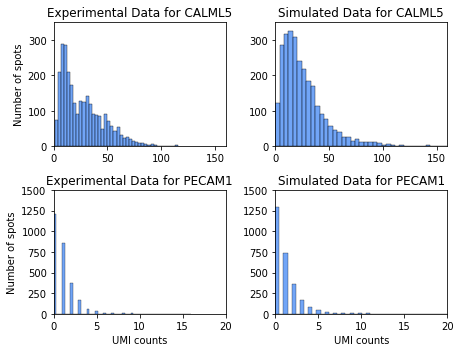

In [9]:
adata_real = sc.datasets.visium_sge(sample_id="V1_Breast_Cancer_Block_A_Section_1")
adata_real.X = adata_real.X.todense()
sc.pp.filter_cells(adata_real, min_counts=5000)
sc.pp.filter_cells(adata_real, max_counts=35000)

fig, axarr = plt.subplots(
    2,
    2,
    figsize=(6.5,5)
    #sharey=True
)
sns.histplot(
    adata_real.obs_vector('CALML5'), 
    bins=40, 
    ax=axarr[0][0], 
    color='#4287f5')
sns.histplot(
    df_sim_data_cs_0_0_spotwise_CALML5['count_gene_1'], 
    bins=40, 
    ax=axarr[0][1],
    color='#4287f5'
    )
sns.histplot(
    adata_real.obs_vector('PECAM1'), 
    bins=50, 
    ax=axarr[1][0],
    color='#4287f5'
)
sns.histplot(
    df_sim_data_cs_0_0_spotwise_PECAM1['count_gene_1'], 
    bins=50, 
    ax=axarr[1][1],
    color='#4287f5'
)
axarr[0][0].set_ylim((0, 350))
axarr[0][1].set_ylim((0, 350))
axarr[0][0].set_xlim((0, 160))
axarr[0][1].set_xlim((0, 160))
axarr[1][0].set_ylim((0, 1500))
axarr[1][1].set_ylim((0, 1500))
axarr[1][0].set_xlim((0, 20))
axarr[1][1].set_xlim((0, 20))
axarr[0][0].set_title('Experimental Data for CALML5')
axarr[0][1].set_title('Simulated Data for CALML5')
axarr[1][0].set_title('Experimental Data for PECAM1')
axarr[1][1].set_title('Simulated Data for PECAM1')
axarr[1][0].set_xlabel('UMI counts')
axarr[1][1].set_xlabel('UMI counts')
axarr[0][0].set_xlabel('')
axarr[0][1].set_xlabel('')
axarr[0][0].set_ylabel('Number of spots')
axarr[1][0].set_ylabel('Number of spots')
axarr[0][1].set_ylabel('')
axarr[1][1].set_ylabel('')
plt.tight_layout()
plt.savefig('./figures/simulated_vs_real_hists.pdf', format='pdf')
plt.show()

#### Results of test when using spotwise size-factors

In [10]:
df_sim_sig_5_cs_0_0_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-g_PECAM1.PECAM1_sf_spotwise_sigma_10_cs_0.0.tsv'),
    sep='\t', index_col=0
)

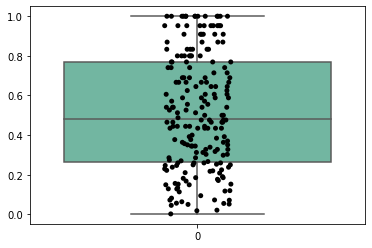

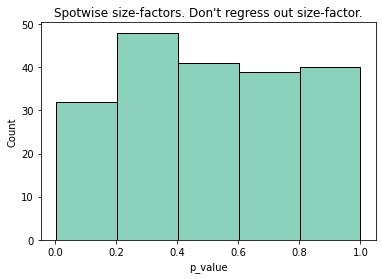

In [11]:
sns.boxplot(data=df_sim_sig_5_cs_0_0_spotwise_PECAM1['p_value'])
sns.stripplot(data=df_sim_sig_5_cs_0_0_spotwise_PECAM1['p_value'], color='black')
plt.show()

sns.histplot(df_sim_sig_5_cs_0_0_spotwise_PECAM1['p_value'], bins=5)
plt.title("Spotwise size-factors. Don't regress out size-factor.")
plt.show()

Create a publication quality figure with these results:

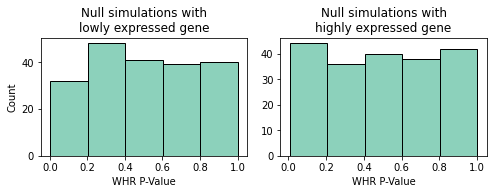

In [13]:
fig, axarr = plt.subplots(
    1,
    2,
    figsize=(7,2.8)
)
sns.histplot(df_sim_sig_5_cs_0_0_spotwise_PECAM1['p_value'], bins=5, ax=axarr[0])
axarr[0].set_xlabel('WHR P-Value')
axarr[0].set_title("Null simulations with\nlowly expressed gene")
sns.histplot(df_sim_sig_5_cs_0_0_spotwise['p_value'], bins=5, ax=axarr[1])
axarr[1].set_xlabel('WHR P-Value')
axarr[1].set_title("Null simulations with\nhighly expressed gene")
axarr[1].set_ylabel("")

plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/null_distr_p_values_within_test.pdf'), format='pdf')

### Results on CALML5 and CALML5 with increasing covariance strengths

Load the results from the statistical test

In [14]:
df_sim_sig_5_cs_0_0025_spotwise = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-g_CALML5.CALML5_sf_spotwise_sigma_10_cs_0.0025.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_025_spotwise = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-g_CALML5.CALML5_sf_spotwise_sigma_10_cs_0.025.tsv'),
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_05_spotwise = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-g_CALML5.CALML5_sf_spotwise_sigma_10_cs_0.05.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_1_spotwise = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-g_CALML5.CALML5_sf_spotwise_sigma_10_cs_0.1.tsv'), 
    sep='\t', index_col=0
)

Load a few example simulated datasets just to visualize them

In [15]:
df_sim_data_cs_0_0025_spotwise = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_CALML5.CALML5_sigma_10_cs_0.0025/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_025_spotwise = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_CALML5.CALML5_sigma_10_cs_0.025/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_05_spotwise = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_CALML5.CALML5_sigma_10_cs_0.05/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_spotwise = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_CALML5.CALML5_sigma_10_cs_0.1/0.tsv'),
    sep='\t', index_col=0
)

Covariance strength: 0.0025


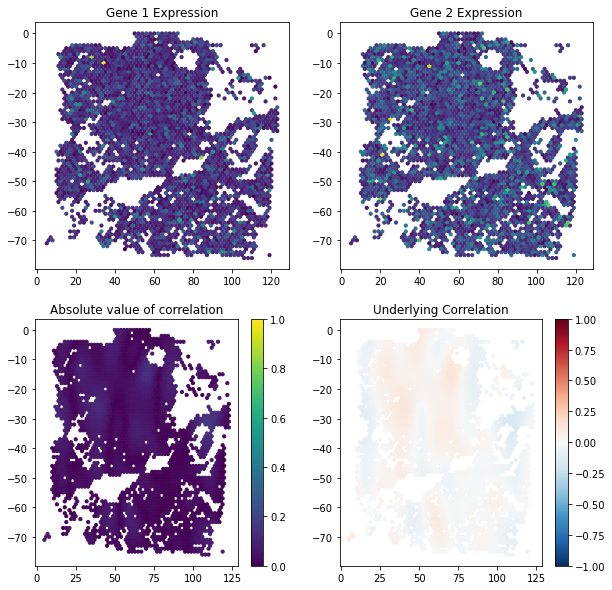

Covariance strength: 0.025


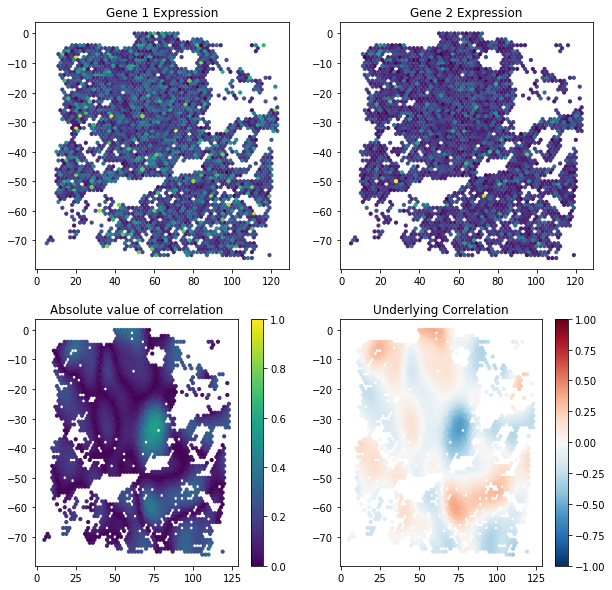

Covariance strength: 0.05


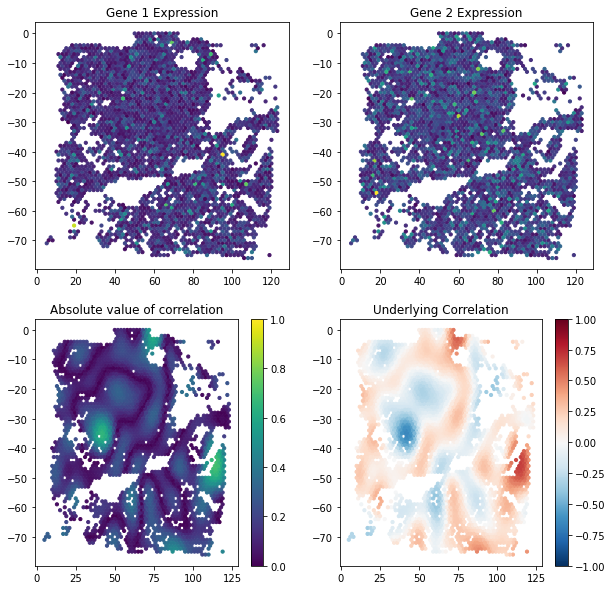

Covariance strength: 0.1


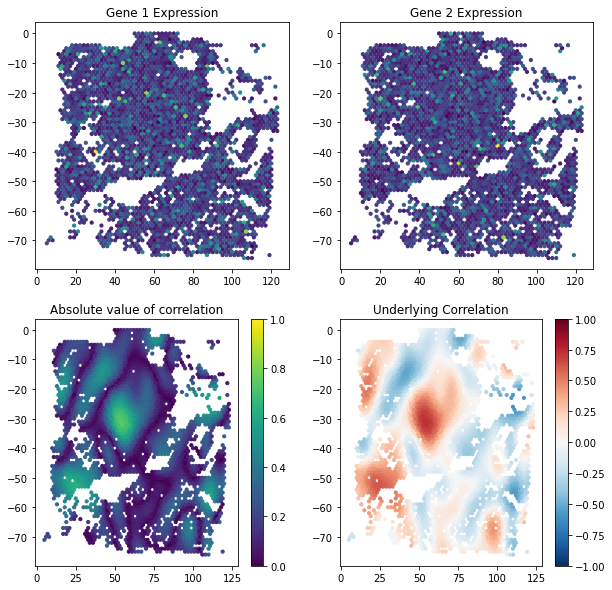

In [16]:
print("Covariance strength: 0.0025")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_0025_spotwise, 
    df_sim_data_cs_0_0025_spotwise['dino_gene_1'], 
    df_sim_data_cs_0_0025_spotwise['dino_gene_2'], 
    df_sim_data_cs_0_0025_spotwise['correlation'], 
    df_sim_data_cs_0_0025_spotwise['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Covariance strength: 0.025")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_025_spotwise, 
    df_sim_data_cs_0_025_spotwise['dino_gene_1'], 
    df_sim_data_cs_0_025_spotwise['dino_gene_2'], 
    df_sim_data_cs_0_025_spotwise['correlation'], 
    df_sim_data_cs_0_025_spotwise['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Covariance strength: 0.05")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_05_spotwise, 
    df_sim_data_cs_0_05_spotwise['dino_gene_1'], 
    df_sim_data_cs_0_05_spotwise['dino_gene_2'], 
    df_sim_data_cs_0_05_spotwise['correlation'], 
    df_sim_data_cs_0_05_spotwise['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Covariance strength: 0.1")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_1_spotwise, 
    df_sim_data_cs_0_1_spotwise['dino_gene_1'], 
    df_sim_data_cs_0_1_spotwise['dino_gene_2'], 
    df_sim_data_cs_0_1_spotwise['correlation'], 
    df_sim_data_cs_0_1_spotwise['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

Create a nice figure with some of this data for a publication

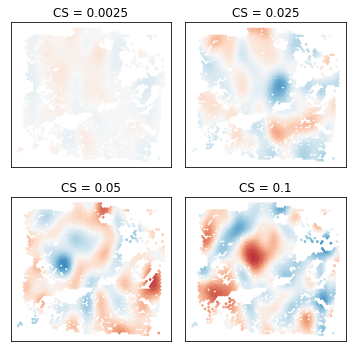

In [17]:
figure, axarr = plt.subplots(
    2,
    2,
    figsize = (5,5)
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_0025_spotwise, 
    df_sim_data_cs_0_0025_spotwise['correlation'], 
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='CS = 0.0025',
    row_key='row',
    col_key='col',
    dsize=3,
    ticks=False,
    ax=axarr[0][0],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_025_spotwise, 
    df_sim_data_cs_0_025_spotwise['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='CS = 0.025',
    row_key='row',
    col_key='col',
    dsize=3,
    ticks=False,
    ax=axarr[0][1]
)


spatialcorr.plot_slide(
    df_sim_data_cs_0_05_spotwise, 
    df_sim_data_cs_0_05_spotwise['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='CS = 0.05',
    row_key='row',
    col_key='col',
    dsize=3,
    ticks=False,
    ax=axarr[1][0]
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise, 
    df_sim_data_cs_0_1_spotwise['correlation'],  
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='CS = 0.1',
    row_key='row',
    col_key='col',
    dsize=3,
    ticks=False,
    ax=axarr[1][1]
)

plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/scHOT_vs_SpatialCorr_example_data.pdf'), format='pdf')

plt.show()

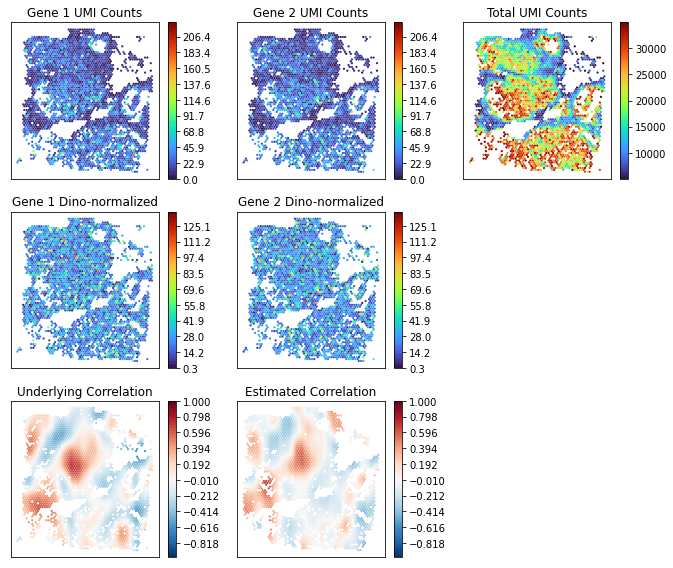

In [18]:
df_sim_data_cs_0_1_spotwise_v2 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_CALML5.CALML5_sigma_10_cs_0.1/0.tsv'),
    sep='\t', index_col=0
)

figure, axarr = plt.subplots(
    3,
    3,
    figsize = (9.5, 8)
)


min_count = min(list(df_sim_data_cs_0_1_spotwise_v2['count_gene_1']) + list(df_sim_data_cs_0_1_spotwise_v2['count_gene_2']))
max_count = max(list(df_sim_data_cs_0_1_spotwise_v2['count_gene_1']) + list(df_sim_data_cs_0_1_spotwise_v2['count_gene_2']))
spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    df_sim_data_cs_0_1_spotwise_v2['count_gene_1'], 
    cmap='turbo',
    colorbar=True,
    vmin=min_count,
    vmax=max_count,
    title='Gene 1 UMI Counts',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[0][0],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    df_sim_data_cs_0_1_spotwise_v2['count_gene_2'], 
    cmap='turbo',
    colorbar=True,
    vmin=min_count,
    vmax=max_count,
    title='Gene 2 UMI Counts',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[0][1],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    #np.log10(df_sim_data_cs_0_1_spotwise_v2['size_factors']),
    df_sim_data_cs_0_1_spotwise_v2['size_factors'],
    cmap='turbo',
    colorbar=True,
    #vmin=min_count,
    #vmax=max_count,
    title='Total UMI Counts',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[0][2],
    figure=figure
)

min_dino = min(
    list(df_sim_data_cs_0_1_spotwise_v2['dino_gene_1']) \
    + list(df_sim_data_cs_0_1_spotwise_v2['dino_gene_2'])
)
max_dino = max(
    list(df_sim_data_cs_0_1_spotwise_v2['dino_gene_1']) \
    + list(df_sim_data_cs_0_1_spotwise_v2['dino_gene_2'])
)
spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    df_sim_data_cs_0_1_spotwise_v2['dino_gene_1'], 
    cmap='turbo',
    colorbar=True,
    vmin=min_dino,
    vmax=max_dino,
    title='Gene 1 Dino-normalized',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[1][0],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    df_sim_data_cs_0_1_spotwise_v2['dino_gene_2'], 
    cmap='turbo',
    colorbar=True,
    vmin=min_dino,
    vmax=max_dino,
    title='Gene 2 Dino-normalized',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[1][1],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    df_sim_data_cs_0_1_spotwise_v2['correlation'], 
    cmap='RdBu_r',
    colorbar=True,
    vmin=-1,
    vmax=1,
    title='Underlying Correlation',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[2][0],
    figure=figure
)

sim_corrs, keep_inds = spatialcorr.utils.compute_local_correlation(
    AnnData(
        X=np.array([
            df_sim_data_cs_0_1_spotwise_v2['dino_gene_1'],
            df_sim_data_cs_0_1_spotwise_v2['dino_gene_2']
        ]).T,
        obs=df_sim_data_cs_0_1_spotwise_v2
    ),
    'dino_gene_1',
    'dino_gene_2',
    row_key='row',
    col_key='col',
    condition=None,
    sigma=5,
    contrib_thresh=10
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2.iloc[keep_inds], 
    sim_corrs, 
    cmap='RdBu_r',
    colorbar=True,
    vmin=-1,
    vmax=1,
    title='Estimated Correlation',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[2][1],
    figure=figure
)

axarr[1][2].set_visible(False)
axarr[2][2].set_visible(False)

plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/dino_normalized_simulation.pdf'), format='pdf')

We see that as the covariance strength increases, the statistical test becomes more sensitive

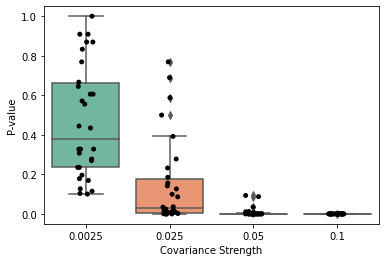

In [19]:
da = [
    (p_val, '0.0025')
    for p_val in df_sim_sig_5_cs_0_0025_spotwise['p_value']
]
da += [
    (p_val, '0.025')
    for p_val in df_sim_sig_5_cs_0_025_spotwise['p_value']
]
da += [
    (p_val, '0.05')
    for p_val in df_sim_sig_5_cs_0_05_spotwise['p_value']
]
da += [
    (p_val, '0.1')
    for p_val in df_sim_sig_5_cs_0_1_spotwise['p_value']
]

plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Covariance Strength']
)
sns.boxplot(data=plot_df, x='Covariance Strength', y='P-value')
sns.stripplot(data=plot_df, x='Covariance Strength', y='P-value', color='black')
plt.show()

#### Test on a more lowly expressed gene

In [20]:
df_sim_data_cs_0_0025_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_PECAM1.PECAM1_sigma_10_cs_0.0025/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_025_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_PECAM1.PECAM1_sigma_10_cs_0.025/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_05_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_PECAM1.PECAM1_sigma_10_cs_0.05/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_PECAM1.PECAM1_sigma_10_cs_0.1/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_2_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_PECAM1.PECAM1_sigma_10_cs_0.2/0.tsv'),
    sep='\t', index_col=0
)

Covariance strength: 0.0025


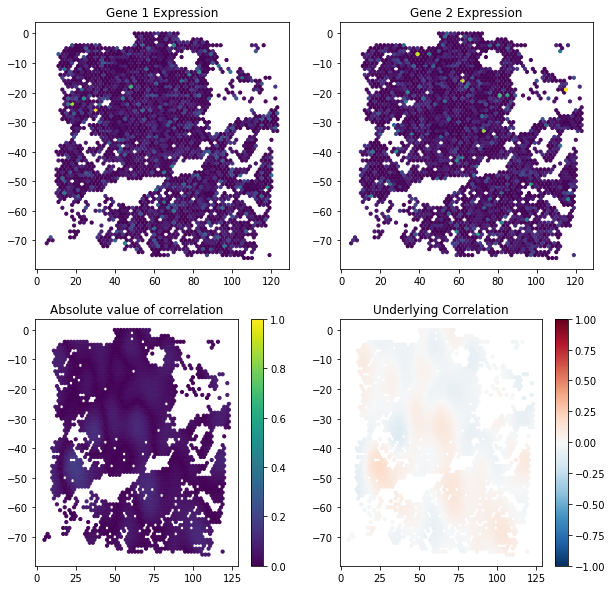

Covariance strength: 0.025


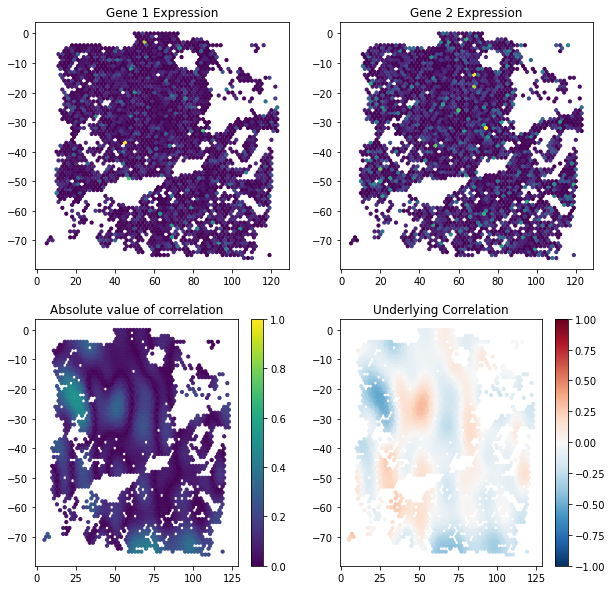

Covariance strength: 0.05


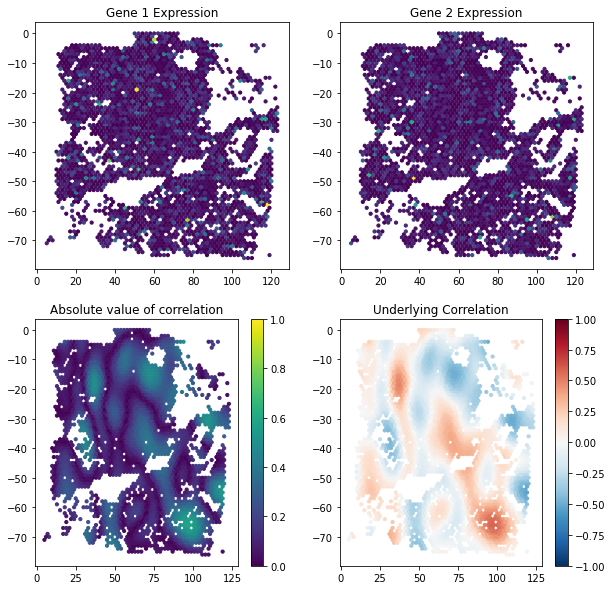

Covariance strength: 0.1


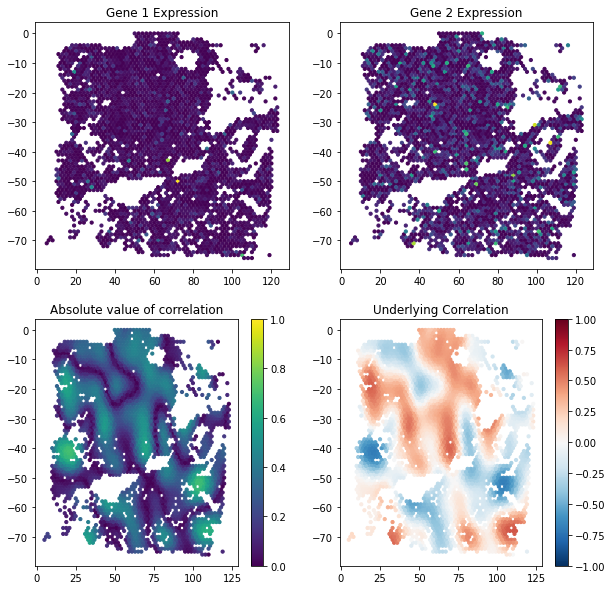

Covariance strength: 0.2


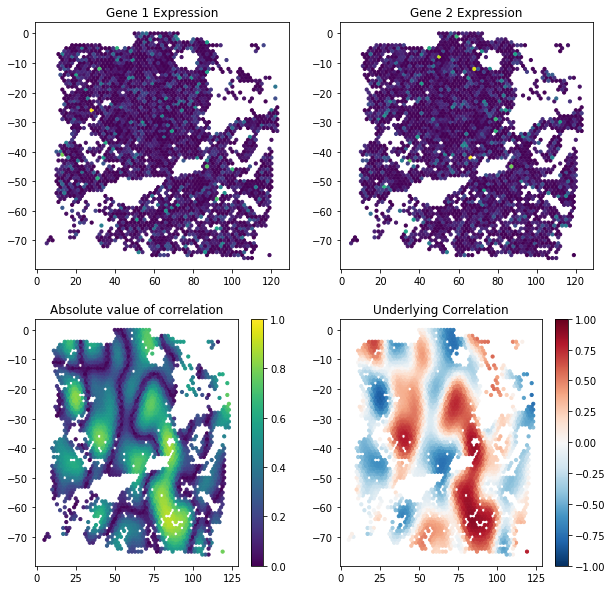

In [21]:
print("Covariance strength: 0.0025")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_0025_spotwise_PECAM1, 
    df_sim_data_cs_0_0025_spotwise_PECAM1['dino_gene_1'], 
    df_sim_data_cs_0_0025_spotwise_PECAM1['dino_gene_2'], 
    df_sim_data_cs_0_0025_spotwise_PECAM1['correlation'], 
    df_sim_data_cs_0_0025_spotwise_PECAM1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Covariance strength: 0.025")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_025_spotwise_PECAM1, 
    df_sim_data_cs_0_025_spotwise_PECAM1['dino_gene_1'], 
    df_sim_data_cs_0_025_spotwise_PECAM1['dino_gene_2'], 
    df_sim_data_cs_0_025_spotwise_PECAM1['correlation'], 
    df_sim_data_cs_0_025_spotwise_PECAM1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Covariance strength: 0.05")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_05_spotwise_PECAM1, 
    df_sim_data_cs_0_05_spotwise_PECAM1['dino_gene_1'], 
    df_sim_data_cs_0_05_spotwise_PECAM1['dino_gene_2'], 
    df_sim_data_cs_0_05_spotwise_PECAM1['correlation'], 
    df_sim_data_cs_0_05_spotwise_PECAM1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Covariance strength: 0.1")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_1_spotwise_PECAM1, 
    df_sim_data_cs_0_1_spotwise_PECAM1['dino_gene_1'], 
    df_sim_data_cs_0_1_spotwise_PECAM1['dino_gene_2'], 
    df_sim_data_cs_0_1_spotwise_PECAM1['correlation'], 
    df_sim_data_cs_0_1_spotwise_PECAM1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Covariance strength: 0.2")
simulate_data.plot_simulated_data(
    df_sim_data_cs_0_2_spotwise_PECAM1, 
    df_sim_data_cs_0_2_spotwise_PECAM1['dino_gene_1'], 
    df_sim_data_cs_0_2_spotwise_PECAM1['dino_gene_2'], 
    df_sim_data_cs_0_2_spotwise_PECAM1['correlation'], 
    df_sim_data_cs_0_2_spotwise_PECAM1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

In [22]:
df_sim_sig_5_cs_0_0025_spotwisee_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-g_PECAM1.PECAM1_sf_spotwise_sigma_10_cs_0.0025.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_025_spotwisee_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-g_PECAM1.PECAM1_sf_spotwise_sigma_10_cs_0.025.tsv'),
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_05_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-g_PECAM1.PECAM1_sf_spotwise_sigma_10_cs_0.05.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_1_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-g_PECAM1.PECAM1_sf_spotwise_sigma_10_cs_0.1.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_2_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-g_PECAM1.PECAM1_sf_spotwise_sigma_10_cs_0.2.tsv'), 
    sep='\t', index_col=0
)

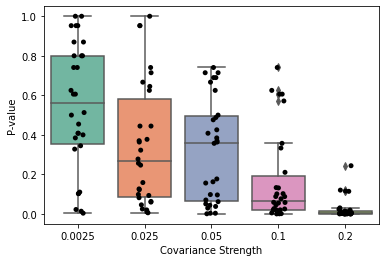

In [23]:
da = [
    (p_val, '0.0025')
    for p_val in df_sim_sig_5_cs_0_0025_spotwisee_PECAM1['p_value']
]
da += [
    (p_val, '0.025')
    for p_val in df_sim_sig_5_cs_0_025_spotwisee_PECAM1['p_value']
]
da += [
    (p_val, '0.05')
    for p_val in df_sim_sig_5_cs_0_05_spotwise_PECAM1['p_value']
]
da += [
    (p_val, '0.1')
    for p_val in df_sim_sig_5_cs_0_1_spotwise_PECAM1['p_value']
]
da += [
    (p_val, '0.2')
    for p_val in df_sim_sig_5_cs_0_2_spotwise_PECAM1['p_value']
]

plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Covariance Strength']
)
sns.boxplot(data=plot_df, x='Covariance Strength', y='P-value')
sns.stripplot(data=plot_df, x='Covariance Strength', y='P-value', color='black')
plt.show()

Create publication-ready figure from these results

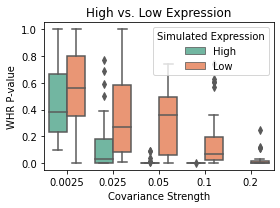

In [24]:
da = [
    (p_val, '0.0025', 'High')
    for p_val in df_sim_sig_5_cs_0_0025_spotwise['p_value']
]
da += [
    (p_val, '0.025', 'High')
    for p_val in df_sim_sig_5_cs_0_025_spotwise['p_value']
]
da += [
    (p_val, '0.05', 'High')
    for p_val in df_sim_sig_5_cs_0_05_spotwise['p_value']
]
da += [
    (p_val, '0.1', 'High')
    for p_val in df_sim_sig_5_cs_0_1_spotwise['p_value']
]
da += [
    (p_val, '0.0025', 'Low')
    for p_val in df_sim_sig_5_cs_0_0025_spotwisee_PECAM1['p_value']
]
da += [
    (p_val, '0.025', 'Low')
    for p_val in df_sim_sig_5_cs_0_025_spotwisee_PECAM1['p_value']
]
da += [
    (p_val, '0.05', 'Low')
    for p_val in df_sim_sig_5_cs_0_05_spotwise_PECAM1['p_value']
]
da += [
    (p_val, '0.1', 'Low')
    for p_val in df_sim_sig_5_cs_0_1_spotwise_PECAM1['p_value']
]
da += [
    (p_val, '0.2', 'Low')
    for p_val in df_sim_sig_5_cs_0_2_spotwise_PECAM1['p_value']
]

plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Covariance Strength', 'Simulated Expression']
)

fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3)
)
sns.boxplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Simulated Expression', ax=ax)
#sns.stripplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Simulated Expression', color='black')
#plt.show()

ax.set_title('High vs. Low Expression')
ax.set_ylabel('WHR P-value')
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/distr_p_vals_high_low_expression_change_cov_strength.pdf'), format='pdf')


### Mean expression different between clusters, static correlation across slide

We'll see how the test does when we condition on cluster versus when we don't. We expect conditioning to help mitigate the problem of differing means leading to artificial false positives.

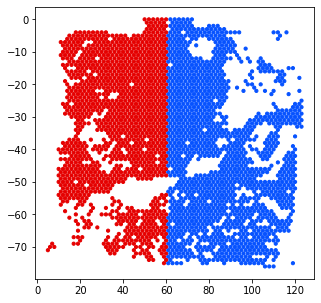

Counts


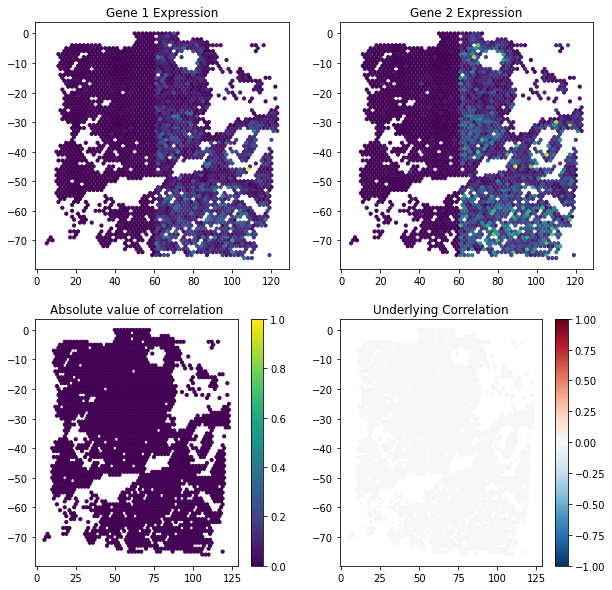

Deviance residuals


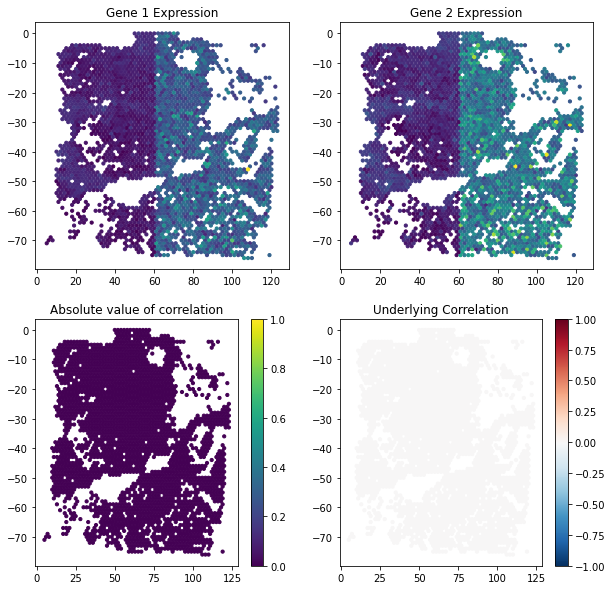

Dino


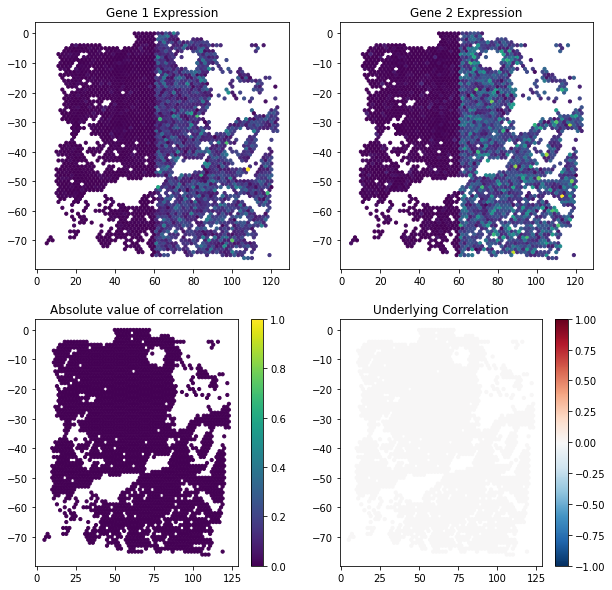

Deviance residuals. Cluster 1.


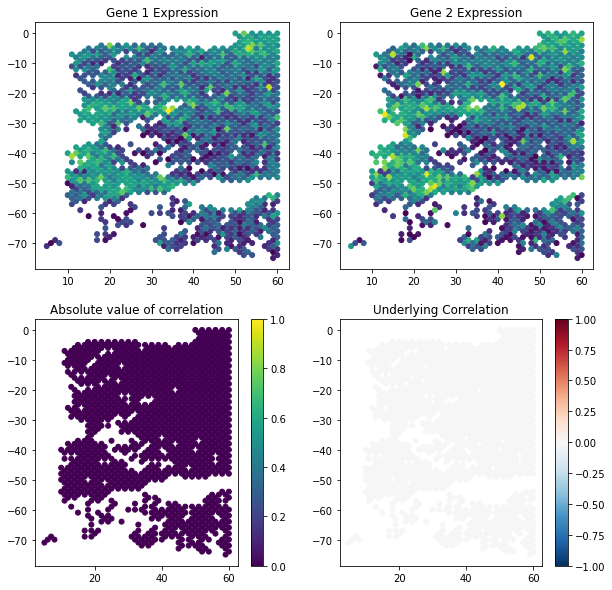

Dino. Cluster 1


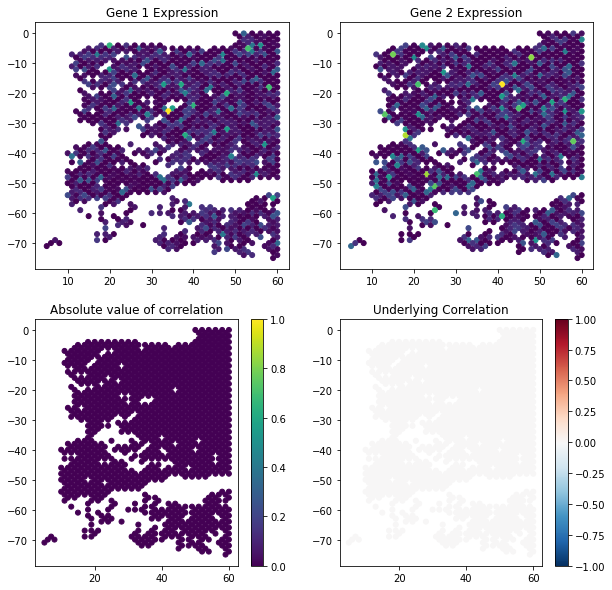

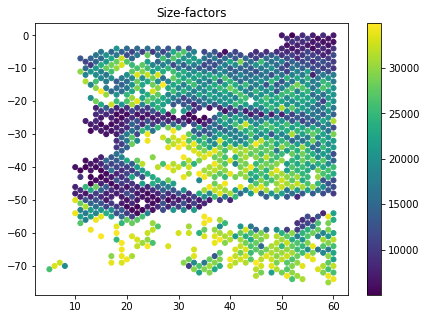

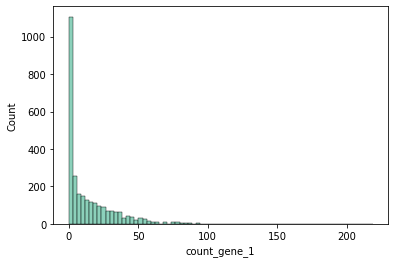

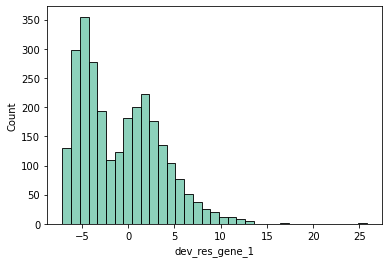

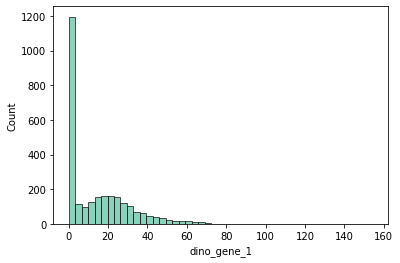

Examine effect of size-factors


/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


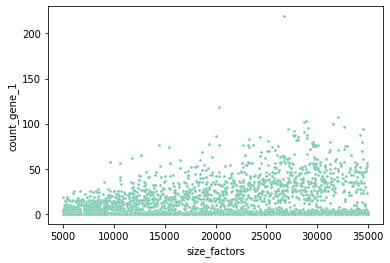

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


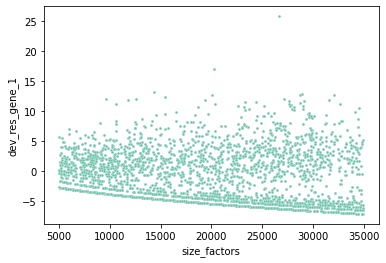

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


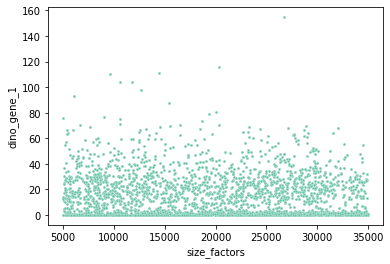

In [25]:
df_sim_data_diff_means_cs_0_0_spotwise_v2 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino', 'config_static.corr.differ.means.2/0.tsv'),
    sep='\t', index_col=0
)


spatialcorr.plot_slide(
    df_sim_data_diff_means_cs_0_0_spotwise_v2, 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'], 
    cmap='categorical',
    colorbar=False,
    #title='Counts',
    row_key='row',
    col_key='col',
    dsize=10
)
plt.show()

print("Counts")
simulate_data.plot_simulated_data(
    df_sim_data_diff_means_cs_0_0_spotwise_v2, 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['count_gene_1'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['count_gene_2'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['correlation'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Deviance residuals")
simulate_data.plot_simulated_data(
    df_sim_data_diff_means_cs_0_0_spotwise_v2, 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dev_res_gene_1'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dev_res_gene_2'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['correlation'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Dino")
simulate_data.plot_simulated_data(
    df_sim_data_diff_means_cs_0_0_spotwise_v2, 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dino_gene_1'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dino_gene_2'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['correlation'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Deviance residuals. Cluster 1.")
simulate_data.plot_simulated_data(
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['dev_res_gene_1'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['dev_res_gene_2'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['correlation'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=25
)
plt.show()

print("Dino. Cluster 1")
simulate_data.plot_simulated_data(
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['dino_gene_1'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['dino_gene_2'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['correlation'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=25
)
plt.show()

spatialcorr.plot_slide(
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['size_factors'], 
    cmap='viridis',
    colorbar=True,
    title='Size-factors',
    dsize=25
)
plt.show()

sns.histplot(df_sim_data_diff_means_cs_0_0_spotwise_v2['count_gene_1'])
plt.show()

sns.histplot(df_sim_data_diff_means_cs_0_0_spotwise_v2['dev_res_gene_1'])
plt.show()

sns.histplot(df_sim_data_diff_means_cs_0_0_spotwise_v2['dino_gene_1'])
plt.show()

print("Examine effect of size-factors")
sns.scatterplot(
    df_sim_data_diff_means_cs_0_0_spotwise_v2['size_factors'],
    df_sim_data_diff_means_cs_0_0_spotwise_v2['count_gene_1'],
    s=8
)
plt.show()

sns.scatterplot(
    df_sim_data_diff_means_cs_0_0_spotwise_v2['size_factors'],
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dev_res_gene_1'],
    s=8
)
plt.show()

sns.scatterplot(
    df_sim_data_diff_means_cs_0_0_spotwise_v2['size_factors'],
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dino_gene_1'],
    s=8
)
plt.show()

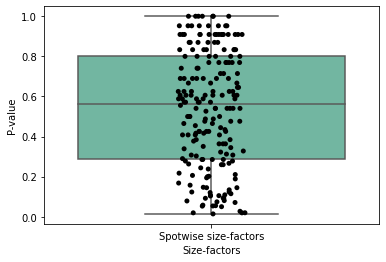

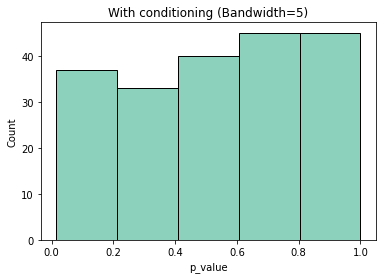

In [26]:
# Spotwise size-factors
sns.set_palette('Set2')
df_sim_diff_means_cs_0_0_spotwise_condition_v2 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_within_dino-config_static.corr.differ.means.2.tsv'), 
    sep='\t', index_col=0
)
da = [
    (p_val, 'Spotwise size-factors')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_condition_v2['p_value']
]
plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Size-factors']
)
sns.boxplot(data=plot_df, x='Size-factors', y='P-value')
sns.stripplot(data=plot_df, x='Size-factors', y='P-value', color='black')
plt.show()

sns.histplot(df_sim_diff_means_cs_0_0_spotwise_condition_v2['p_value'], bins=5)
plt.title('With conditioning (Bandwidth=5)')
plt.show()

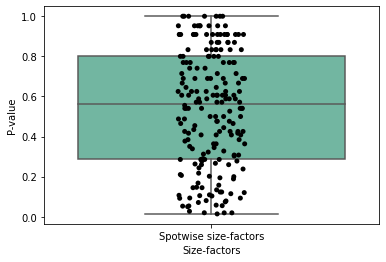

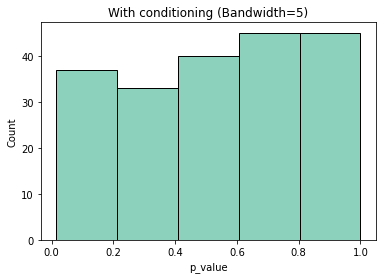

In [27]:
# Spotwise size-factors
df_sim_diff_means_cs_0_0_spotwise_condition_v2 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_within_dino-config_static.corr.differ.means.2.tsv'), 
    sep='\t', index_col=0
)
da = [
    (p_val, 'Spotwise size-factors')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_condition_v2['p_value']
]
plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Size-factors']
)
sns.boxplot(data=plot_df, x='Size-factors', y='P-value')
sns.stripplot(data=plot_df, x='Size-factors', y='P-value', color='black')
plt.show()

sns.histplot(df_sim_diff_means_cs_0_0_spotwise_condition_v2['p_value'], bins=5)
plt.title('With conditioning (Bandwidth=5)')
plt.show()

## Examine the between-clusters test results

#### Examine the results on some null datasets in which there is no difference in correlation between groups. Moreover, there is no difference in means.

In [28]:
df_sim_static_means_CALML5_corr_between_0_0_spotwise = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_0.static.means_CALML5.spotwise.tsv'),
    sep='\t', index_col=0
)

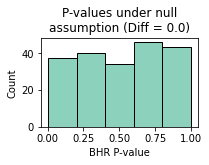

In [29]:
fig, ax = plt.subplots(
    1,
    1,
    figsize = (3,2.4)
)
sns.histplot(df_sim_static_means_CALML5_corr_between_0_0_spotwise['p_value'], bins=5, ax=ax)
ax.set_xlabel('BHR P-value')
plt.title('P-values under null\nassumption (Diff = 0.0)')

plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/distr_p_vals_null_BHR_static_means.pdf'), format='pdf')

#### Now start increasing the difference in the correlation between groups. Note, there is no difference in their means

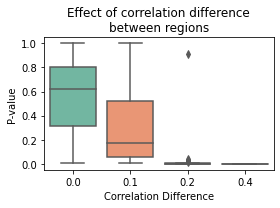

In [30]:
df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_1 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_1.static.means_CALML5.tsv'),
    sep='\t', index_col=0
)
df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_2 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_2.static.means_CALML5.tsv'),
    sep='\t', index_col=0
)
df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_4 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_4.static.means_CALML5.tsv'),
    sep='\t', index_col=0
)

da = [ 
    (p_val, '0.0')
    for p_val in df_sim_static_means_CALML5_corr_between_0_0_spotwise['p_value'][:30]
]
da += [
    (p_val, '0.1')
    for p_val in df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_1['p_value']
]
da += [
    (p_val, '0.2')
    for p_val in df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_2['p_value']
]
da += [
    (p_val, '0.4')
    for p_val in df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_4['p_value']
]
plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Correlation Difference']
)



fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3)
)
sns.boxplot(data=plot_df, x='Correlation Difference', y='P-value', ax=ax)
#sns.stripplot(data=plot_df, x='Correlation Difference', y='P-value', color='black', ax=ax)
ax.set_title("Effect of correlation difference\nbetween regions")
#plt.show()

plt.tight_layout()
fig.savefig('./figures/p_value_distr_BHR_increase_corr_diff_means_static.pdf', format='pdf')

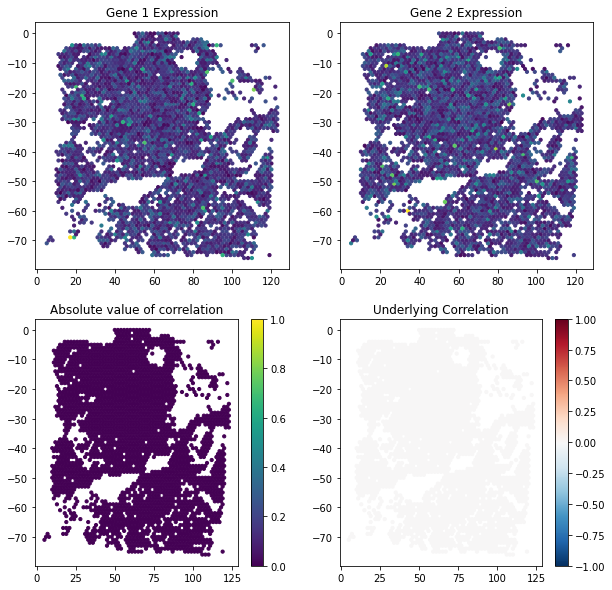

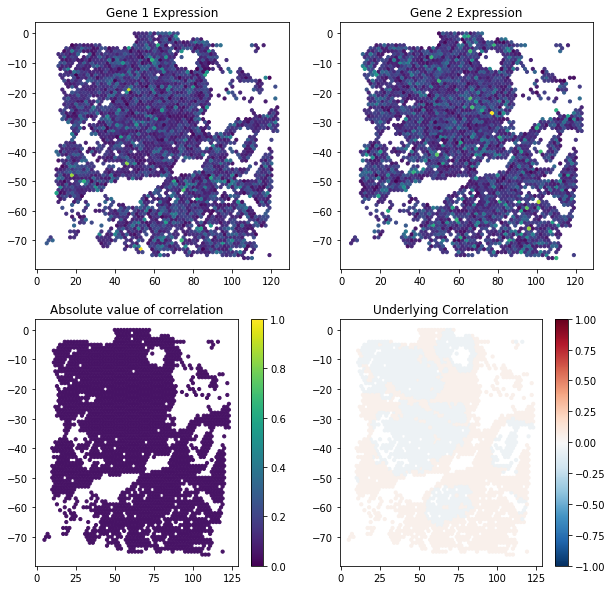

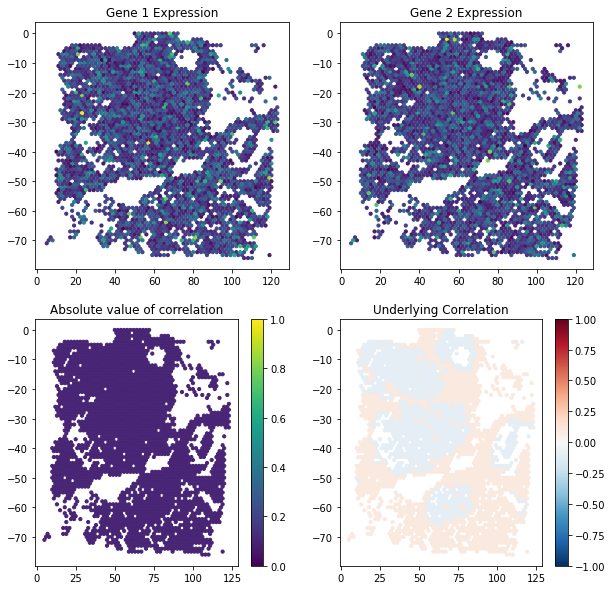

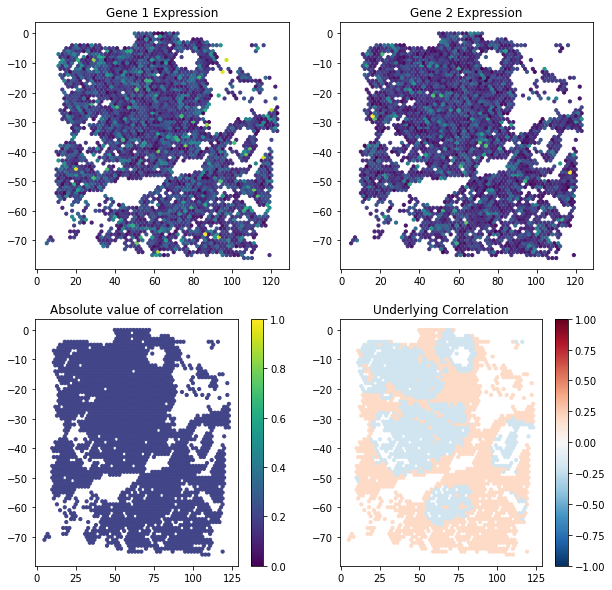

In [31]:
df_sim_data_means_static_corr_differ_0_0 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_0.static.means_CALML5.spotwise/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_static_corr_differ_0_1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_1.static.means_CALML5/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_static_corr_differ_0_2 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_2.static.means_CALML5/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_static_corr_differ_0_4 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_4.static.means_CALML5/0.tsv'),
    sep='\t', index_col=0
)

simulate_data.plot_simulated_data(
    df_sim_data_means_static_corr_differ_0_0, 
    df_sim_data_means_static_corr_differ_0_0['dino_gene_1'], 
    df_sim_data_means_static_corr_differ_0_0['dino_gene_2'], 
    df_sim_data_means_static_corr_differ_0_0['correlation'], 
    df_sim_data_means_static_corr_differ_0_0['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_static_corr_differ_0_1, 
    df_sim_data_means_static_corr_differ_0_1['dino_gene_1'], 
    df_sim_data_means_static_corr_differ_0_1['dino_gene_2'], 
    df_sim_data_means_static_corr_differ_0_1['correlation'], 
    df_sim_data_means_static_corr_differ_0_1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_static_corr_differ_0_2, 
    df_sim_data_means_static_corr_differ_0_2['dino_gene_1'], 
    df_sim_data_means_static_corr_differ_0_2['dino_gene_2'], 
    df_sim_data_means_static_corr_differ_0_2['correlation'], 
    df_sim_data_means_static_corr_differ_0_2['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_static_corr_differ_0_4, 
    df_sim_data_means_static_corr_differ_0_4['dino_gene_1'], 
    df_sim_data_means_static_corr_differ_0_4['dino_gene_2'], 
    df_sim_data_means_static_corr_differ_0_4['correlation'], 
    df_sim_data_means_static_corr_differ_0_4['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

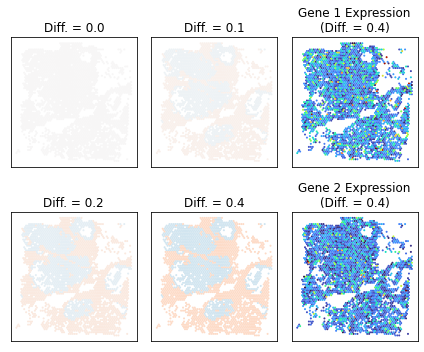

In [32]:
figure, axarr = plt.subplots(
    2,
    3,
    figsize = (6,5)
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_0,
    df_sim_data_means_static_corr_differ_0_0['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.0',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][0],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_1,
    df_sim_data_means_static_corr_differ_0_1['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.1',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][1],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_2, 
    df_sim_data_means_static_corr_differ_0_2['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.2',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][0]
)


spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_4, 
    df_sim_data_means_static_corr_differ_0_4['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.4',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][1]
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_4,
    df_sim_data_means_static_corr_differ_0_4['dino_gene_1'],
    cmap='turbo',
    #colorbar=True,
    #vmin=-1,
    #vmax=1,
    title='Gene 1 Expression\n(Diff. = 0.4)',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][2],
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_4,
    df_sim_data_means_static_corr_differ_0_4['dino_gene_2'],
    cmap='turbo',
    title='Gene 2 Expression\n(Diff. = 0.4)',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][2],
)


plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/BHR_example_data_static_means.pdf'), format='pdf')

plt.show()

## Examine the results on some null datasets in which there is no difference in correlation between groups. However, there IS a difference in means.

In [33]:
df_sim_diff_means_cs_0_0_spotwise_test_between = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_static.corr.differ.means.tsv'),
    sep='\t', index_col=0
)

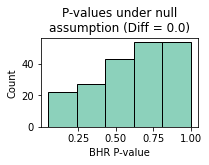

In [34]:
fig, ax = plt.subplots(
    1,
    1,
    figsize = (3,2.4)
)
sns.histplot(df_sim_diff_means_cs_0_0_spotwise_test_between['p_value'], bins=5, ax=ax)
ax.set_xlabel('BHR P-value')
plt.title('P-values under null\nassumption (Diff = 0.0)')

plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/distr_p_vals_null_BHR_diff_means.pdf'), format='pdf')

#### Increase difference in correlation between groups

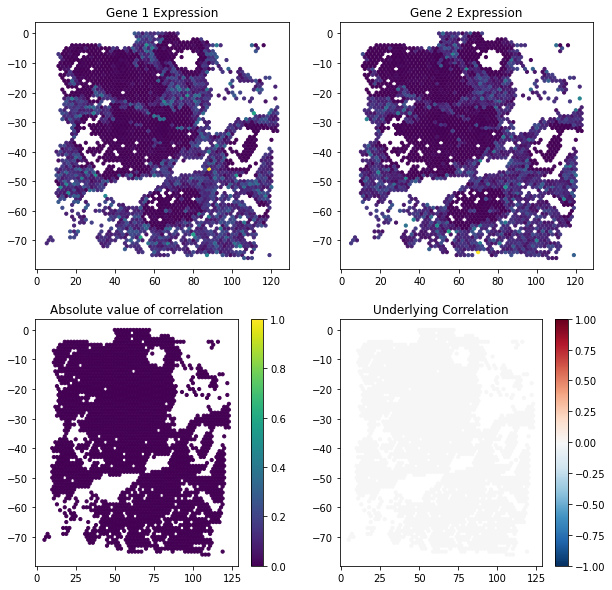

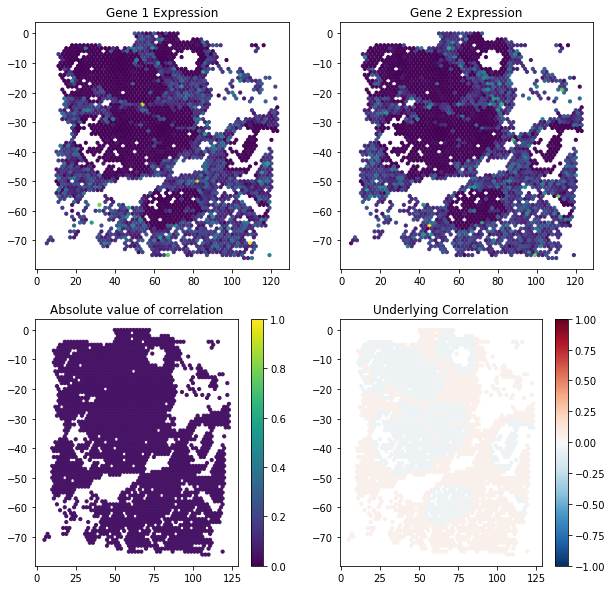

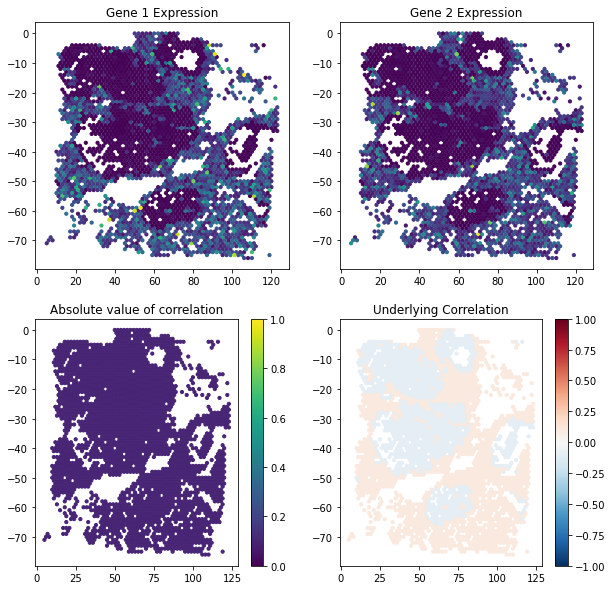

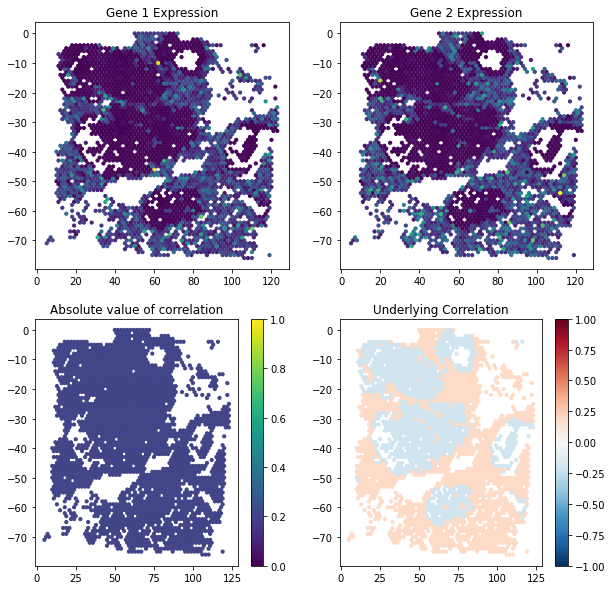

In [35]:
df_sim_data_means_differ_corr_differ_0_0 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_static.corr.differ.means/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_differ_corr_differ_0_1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_1.differ.means/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_differ_corr_differ_0_2 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_2.differ.means/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_differ_corr_differ_0_4 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_4.differ.means/0.tsv'),
    sep='\t', index_col=0
)

simulate_data.plot_simulated_data(
    df_sim_data_means_differ_corr_differ_0_0, 
    df_sim_data_means_differ_corr_differ_0_0['dino_gene_1'], 
    df_sim_data_means_differ_corr_differ_0_0['dino_gene_2'], 
    df_sim_data_means_differ_corr_differ_0_0['correlation'], 
    df_sim_data_means_differ_corr_differ_0_0['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_differ_corr_differ_0_1, 
    df_sim_data_means_differ_corr_differ_0_1['dino_gene_1'], 
    df_sim_data_means_differ_corr_differ_0_1['dino_gene_2'], 
    df_sim_data_means_differ_corr_differ_0_1['correlation'], 
    df_sim_data_means_differ_corr_differ_0_1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_differ_corr_differ_0_2, 
    df_sim_data_means_differ_corr_differ_0_2['dino_gene_1'], 
    df_sim_data_means_differ_corr_differ_0_2['dino_gene_2'], 
    df_sim_data_means_differ_corr_differ_0_2['correlation'], 
    df_sim_data_means_differ_corr_differ_0_2['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_differ_corr_differ_0_4, 
    df_sim_data_means_differ_corr_differ_0_4['dino_gene_1'], 
    df_sim_data_means_differ_corr_differ_0_4['dino_gene_2'], 
    df_sim_data_means_differ_corr_differ_0_4['correlation'], 
    df_sim_data_means_differ_corr_differ_0_4['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

Create publication-ready figure

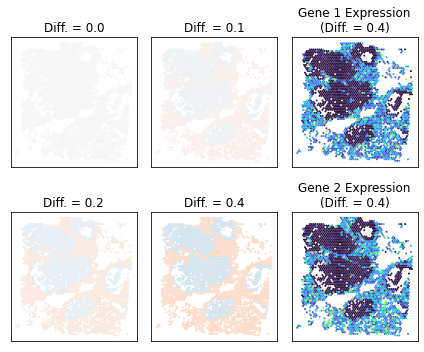

In [36]:
figure, axarr = plt.subplots(
    2,
    3,
    figsize = (6,5)
)

spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_0,
    df_sim_data_means_differ_corr_differ_0_0['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.0',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][0],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_1,
    df_sim_data_means_differ_corr_differ_0_1['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.1',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][1],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_2, 
    df_sim_data_means_differ_corr_differ_0_2['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.2',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][0]
)


spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_4, 
    df_sim_data_means_differ_corr_differ_0_4['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.4',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][1]
)

spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_4,
    df_sim_data_means_differ_corr_differ_0_4['dino_gene_1'],
    cmap='turbo',
    title='Gene 1 Expression\n(Diff. = 0.4)',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][2],
)

spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_4,
    df_sim_data_means_differ_corr_differ_0_4['dino_gene_2'],
    cmap='turbo',
    title='Gene 2 Expression\n(Diff. = 0.4)',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][2],
)


plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/BHR_example_data_diff_means.pdf'), format='pdf')

plt.show()

Create figure for supplement illustration cl

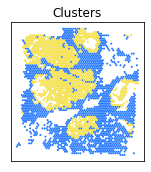

In [37]:
fig, ax = plt.subplots(
    1,
    1,
    figsize = (2.2,2.5)
)
spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_4, 
    [
        x in set([0, 1])
        for x in df_sim_data_means_differ_corr_differ_0_4['cluster']
    ],  
    cmap='categorical',
    #colorbar=True,
    #vmin=-1,
    #vmax=1,
    title='Clusters',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=ax,
    cat_palette = ['#f5e049', '#297bff']
)
ax.set_title('Clusters')
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/BHR_example_data_clusters.pdf'), format='pdf')

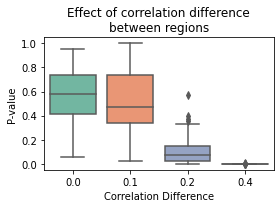

In [39]:
df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_1 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_1.differ.means.tsv'),
    sep='\t', index_col=0
)
df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_2 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_2.differ.means.tsv'),
    sep='\t', index_col=0
)
df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_4 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_4.differ.means.tsv'),
    sep='\t', index_col=0
)


da = [
    (p_val, '0.0')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_test_between['p_value'][:30]
]
da += [
    (p_val, '0.1')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_1['p_value']
]
da += [
    (p_val, '0.2')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_2['p_value']
]
da += [
    (p_val, '0.4')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_4['p_value']
]
plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Correlation Difference']
)

fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3)
)
sns.boxplot(data=plot_df, x='Correlation Difference', y='P-value', ax=ax)
#sns.stripplot(data=plot_df, x='Correlation Difference', y='P-value', color='black', ax=ax)
ax.set_title("Effect of correlation difference\nbetween regions")
#plt.show()

plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/p_value_distr_BHR_increase_corr_diff.pdf'), format='pdf')

## Multiple genes

First let's just visualize one of the multi-gene datasets

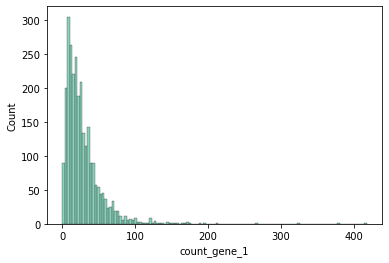

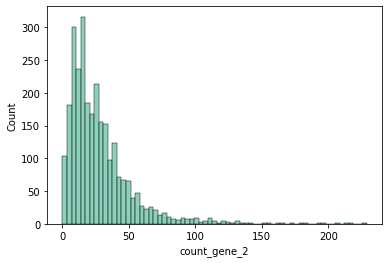

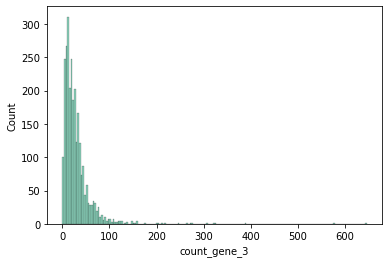

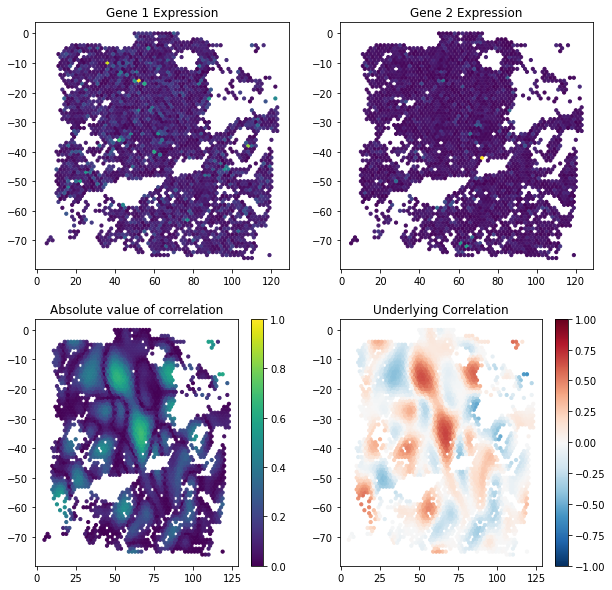

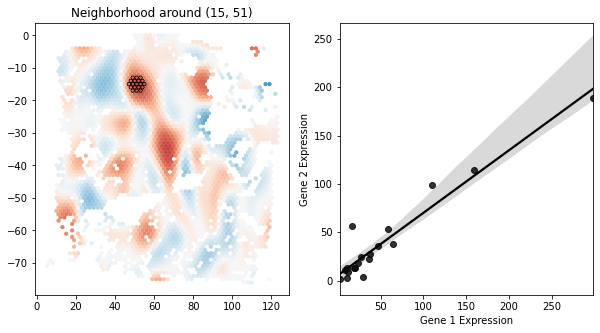

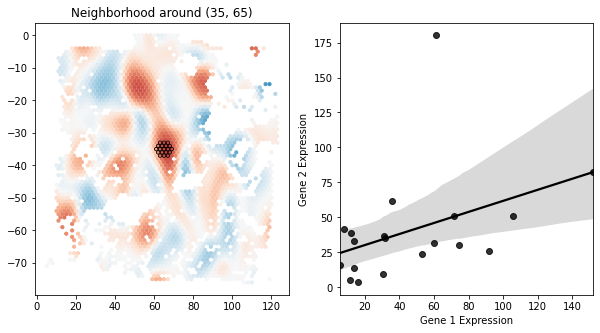

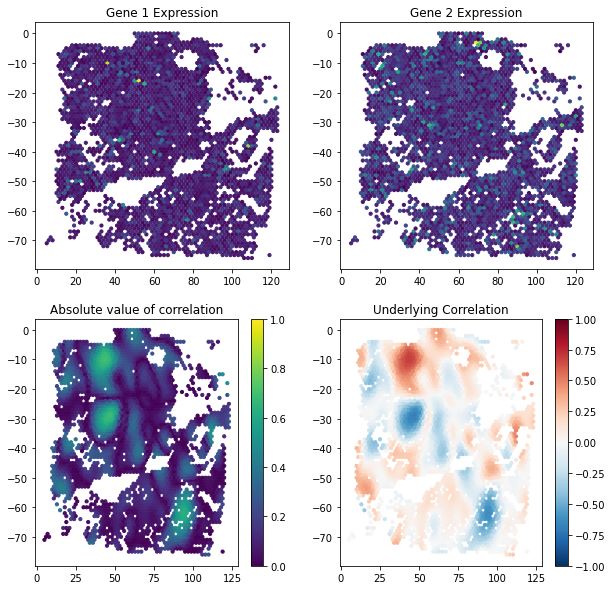

In [40]:
df_sim_data_mult_genes_cs_0_1_all_CALML5 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/mg_5.CALML5_sigma_10_cs_0.1/0.tsv'),
    sep='\t', index_col=0
)
corrs_0_1 = [eval(x)[0][1] for x in df_sim_data_mult_genes_cs_0_1_all_CALML5['correlation']]
covs_0_1 = [eval(x)[0][1] for x in df_sim_data_mult_genes_cs_0_1_all_CALML5['covariance']]

corrs_0_2 = [eval(x)[0][2] for x in df_sim_data_mult_genes_cs_0_1_all_CALML5['correlation']]
covs_0_2 = [eval(x)[0][2] for x in df_sim_data_mult_genes_cs_0_1_all_CALML5['covariance']]

sns.histplot(df_sim_data_mult_genes_cs_0_1_all_CALML5['count_gene_1'])
plt.show()

sns.histplot(df_sim_data_mult_genes_cs_0_1_all_CALML5['count_gene_2'])
plt.show()

sns.histplot(df_sim_data_mult_genes_cs_0_1_all_CALML5['count_gene_3'])
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_mult_genes_cs_0_1_all_CALML5, 
    df_sim_data_mult_genes_cs_0_1_all_CALML5['dino_gene_0'], 
    df_sim_data_mult_genes_cs_0_1_all_CALML5['dino_gene_1'], 
    corrs_0_1, 
    covs_0_1, 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()


spatialcorr.plot.plot_local_scatter(
    build_adata_from_sim_dataframe(
        df_sim_data_mult_genes_cs_0_1_all_CALML5,
        g1='dino_gene_0',
        g2='dino_gene_1'
    ),
    'Gene 1',
    'Gene 2',
    15, 51,
    corrs_0_1,
    color_spots=None,
    condition=None,
    vmin=-1,
    vmax=1,
    row_key='row',
    col_key='col',
    cmap='RdBu_r',
    neighb_color='black',
    plot_neigh=True,
    width=10,
    height=5,
    line_color='black',
    scatter_xlim=None,
    scatter_ylim=None,
    scatter_xlabel=None,
    scatter_ylabel=None,
    scatter_title=None,
    fig_path=None,
    fig_format='pdf',
    fig_dpi=150,
)

spatialcorr.plot.plot_local_scatter(
    build_adata_from_sim_dataframe(
        df_sim_data_mult_genes_cs_0_1_all_CALML5,
        g1='dino_gene_0',
        g2='dino_gene_1'
    ),
    'Gene 1',
    'Gene 2',
    35, 65,
    corrs_0_1,
    color_spots=None,
    condition=None,
    vmin=-1,
    vmax=1,
    row_key='row',
    col_key='col',
    cmap='RdBu_r',
    neighb_color='black',
    plot_neigh=True,
    width=10,
    height=5,
    line_color='black',
    scatter_xlim=None,
    scatter_ylim=None,
    scatter_xlabel=None,
    scatter_ylabel=None,
    scatter_title=None,
    fig_path=None,
    fig_format='pdf',
    fig_dpi=150,
)

simulate_data.plot_simulated_data(
    df_sim_data_mult_genes_cs_0_1_all_CALML5, 
    df_sim_data_mult_genes_cs_0_1_all_CALML5['dino_gene_0'], 
    df_sim_data_mult_genes_cs_0_1_all_CALML5['dino_gene_2'], 
    corrs_0_2, 
    covs_0_2, 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

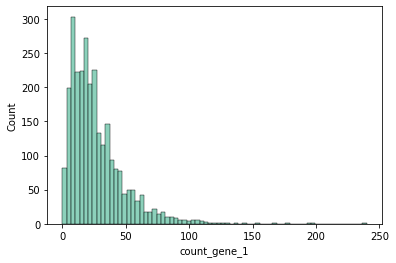

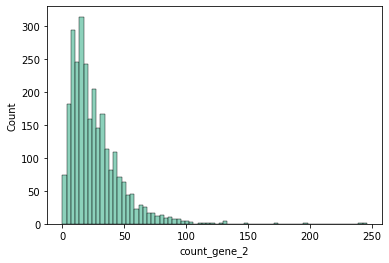

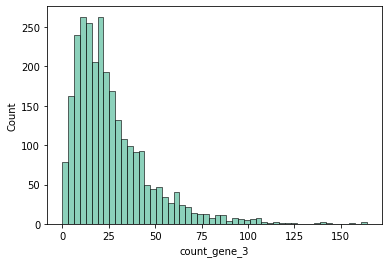

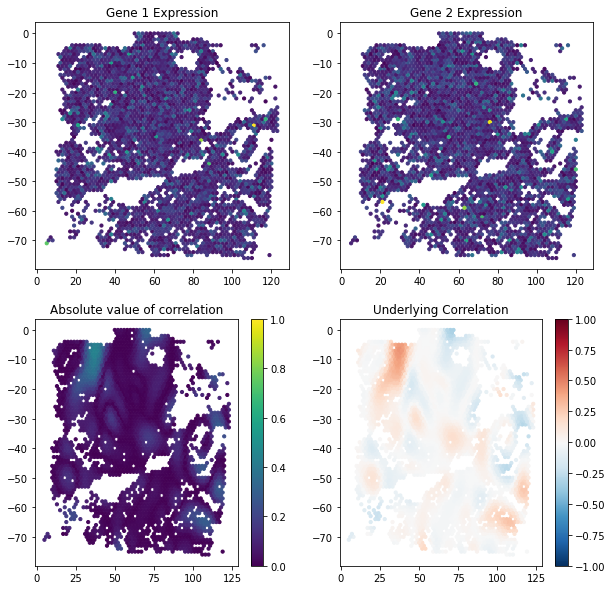

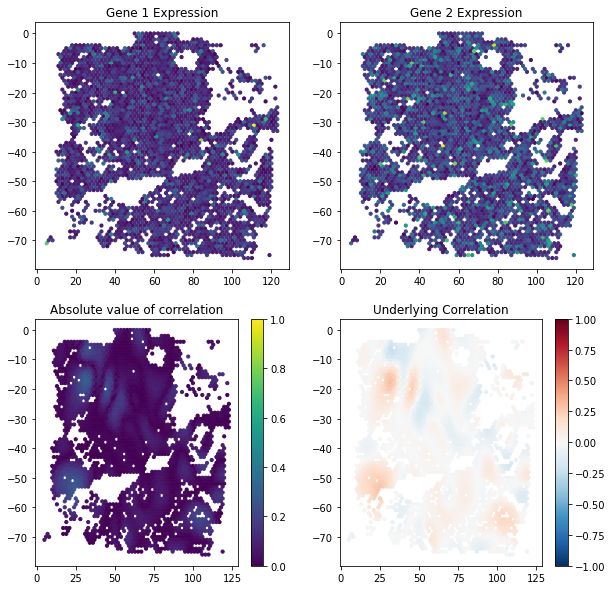

In [41]:
df_sim_data_mult_genes_cs_0_025_all_CALML5 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/mg_5.CALML5_sigma_10_cs_0.025/0.tsv'),
    sep='\t', index_col=0
)
corrs_0_1 = [eval(x)[0][1] for x in df_sim_data_mult_genes_cs_0_025_all_CALML5['correlation']]
covs_0_1 = [eval(x)[0][1] for x in df_sim_data_mult_genes_cs_0_025_all_CALML5['covariance']]

corrs_0_2 = [eval(x)[0][2] for x in df_sim_data_mult_genes_cs_0_025_all_CALML5['correlation']]
covs_0_2 = [eval(x)[0][2] for x in df_sim_data_mult_genes_cs_0_025_all_CALML5['covariance']]

sns.histplot(df_sim_data_mult_genes_cs_0_025_all_CALML5['count_gene_1'])
plt.show()

sns.histplot(df_sim_data_mult_genes_cs_0_025_all_CALML5['count_gene_2'])
plt.show()

sns.histplot(df_sim_data_mult_genes_cs_0_025_all_CALML5['count_gene_3'])
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_mult_genes_cs_0_025_all_CALML5, 
    df_sim_data_mult_genes_cs_0_025_all_CALML5['dino_gene_1'], 
    df_sim_data_mult_genes_cs_0_025_all_CALML5['dino_gene_2'], 
    corrs_0_1, 
    covs_0_1, 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_mult_genes_cs_0_025_all_CALML5, 
    df_sim_data_mult_genes_cs_0_025_all_CALML5['dino_gene_1'], 
    df_sim_data_mult_genes_cs_0_025_all_CALML5['dino_gene_3'], 
    corrs_0_2, 
    covs_0_2, 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

### Compare joint vs. multiple pairwise tests

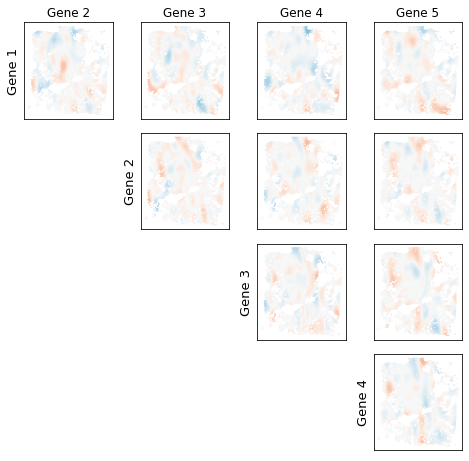

In [44]:
df_sim_data_mult_genes_cs_0_035_all_CALML5 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/mg_5.CALML5_sigma_10_cs_0.035/0.tsv'),
    sep='\t', index_col=0
)

all_sim_corrs = [
    eval(row['correlation'])
    for r_i, row in df_sim_data_mult_genes_cs_0_035_all_CALML5.iterrows()
]

sim_index = 0

fig, axarr = plt.subplots(
    5,
    5,
    figsize=(8,8)
)
for row, ax_row in enumerate(axarr):
    for col, ax in enumerate(ax_row):
        corrs = [
            x[row][col]
            for x in all_sim_corrs
        ]
        if col > row:
            if row == 0:
                title = f'Gene {col+1}'
            else: 
                title = None
                
            if col == row+1:
                ax.set_ylabel(f'Gene {row+1}', fontsize=13)
            spatialcorr.plot_slide(
                df_sim_data_mult_genes_cs_0_035_all_CALML5, 
                corrs, 
                cmap='RdBu_r', 
                colorbar=False, 
                vmin=-1, 
                vmax=1, 
                title=title, 
                ax=ax, 
                figure=fig,
                ticks=False, 
                dsize=0.2,
                row_key='row',
                col_key='col'
            )
        else:
            ax.set_visible(False)
        
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/compare_joint_vs_pairwise_example_data.pdf'), format='pdf')
plt.show()

In [45]:
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_5.CALML5_sigma_10_cs_0.035.json'), 'r') as f:
    j_sim_mg_5_CALML5_cs_0_035_spotwise = json.load(f)
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_5.CALML5_sigma_10_cs_0.035_v2.json'), 'r') as f:
    j_sim_mg_5_CALML5_cs_0_035_spotwise_v2 = json.load(f)
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_5.CALML5_sigma_10_cs_0.035_v3.json'), 'r') as f:
    j_sim_mg_5_CALML5_cs_0_035_spotwise_v3 = json.load(f)

In [46]:
sims_joint_sig = set()
sims_one_pair_sig = set()
all_res = list(j_sim_mg_5_CALML5_cs_0_035_spotwise.values()) \
    + list(j_sim_mg_5_CALML5_cs_0_035_spotwise_v2.values()) \
    + list(j_sim_mg_5_CALML5_cs_0_035_spotwise_v3.values())
for sim_i, sim_res in enumerate(all_res):
    if sim_res['joint_p_value'] < 0.05:
        sims_joint_sig.add(sim_i)
    pvals = list(sim_res['pairwise_p_values'].values())
    r = multipletests(pvals, alpha=0.05, method='fdr_bh')
    if True in set(r[0]):
        sims_one_pair_sig.add(sim_i)

print("Total simulations: ", len(j_sim_mg_5_CALML5_cs_0_035_spotwise) + len(j_sim_mg_5_CALML5_cs_0_035_spotwise_v2))
print("Number w/ joint sig: ", len(sims_joint_sig ))
print("Number w/ joint sig, not pairwise sig: ", len(sims_joint_sig - sims_one_pair_sig))
print("Number w/ pairwise sig, not joint sig: ", len(sims_one_pair_sig - sims_joint_sig))
print("Number w/ pairwise sig, joint sig: ", len(sims_one_pair_sig & sims_joint_sig))

Total simulations:  60
Number w/ joint sig:  75
Number w/ joint sig, not pairwise sig:  31
Number w/ pairwise sig, not joint sig:  5
Number w/ pairwise sig, joint sig:  44


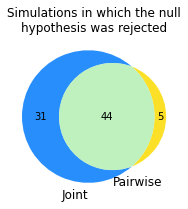

In [47]:
from matplotlib_venn import venn2

fig, ax = plt.subplots(1,1,figsize=(4.2,3))
venn2(
    subsets=(
        len(sims_joint_sig - sims_one_pair_sig), # Left
        len(sims_one_pair_sig - sims_joint_sig), # Right
        len(sims_one_pair_sig & sims_joint_sig) # Center
    ),
    set_labels = (
        'Joint',
        'Pairwise'
    ),
    set_colors=('#037bfc', '#fcdb03'),
    alpha = 0.85,
    ax=ax
)
ax.set_title('Simulations in which the null\nhypothesis was rejected')
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/compare_joint_vs_pairwise_venn.pdf'), format='pdf')
plt.show()

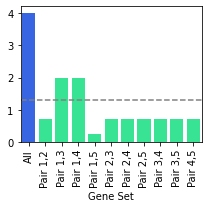

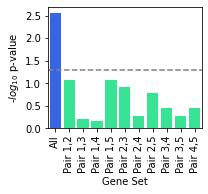

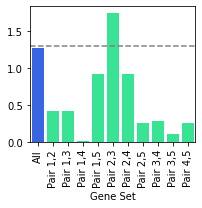

In [48]:


def _create_barplot_joint_vs_pairwise(sim_index, fname, ylabel=True):
    if ylabel:
        dim = (3,2.8)
    else:
        dim = (3, 3)
    fig, ax = plt.subplots(
        1,
        1,
        figsize=dim
    )
    res = j_sim_mg_5_CALML5_cs_0_035_spotwise[sim_index]
    pvals_w_pairs = [
        (pair, pval)
        for pair, pval in res['pairwise_p_values'].items()
    ]
    joint_pval = res['joint_p_value']
    pairs = [x[0] for x in pvals_w_pairs]
    pvals = [x[1] for x in pvals_w_pairs]
    r = multipletests(pvals, alpha=0.05, method='fdr_bh')
    pvals_adj = list(-1 * np.log10(r[1]))
    sns.barplot(
        x=['All'] + [f"Pair {int(x.split(',')[0])+1},{int(x.split(',')[1])+1}" for x in pairs], 
        y=[-1 * np.log10(joint_pval)] + list(pvals_adj), 
        ax=ax, 
        palette=['#1c59ff'] +  ['#1cff95' for x in pairs]
        #palette=['#1c59ff'] +  ['#FFFF00' for x in pairs]
    )
    ax.set_xticklabels(['All'] + [f"Pair {int(x.split(',')[0])+1},{int(x.split(',')[1])+1}" for x in pairs], rotation = 90)
    ax.axhline(-1 * np.log10(0.05), color='grey', ls='--')
    ax.set_xlabel('Gene Set')
    if ylabel:
        ax.set_ylabel(r'-$log_{10}$ p-value')
    #ax.set_title('Compare joint p-value to\npairwise adjusted p-values')
    plt.tight_layout()
    fig.savefig(
        fname, 
        format='pdf'
    )
    plt.show()
    

_create_barplot_joint_vs_pairwise('0', join(DATA_ROOT, 'figures/compare_joint_vs_pairwise_barplot_yes_joint_yes_pairwise.pdf'), ylabel=False);
_create_barplot_joint_vs_pairwise('2', join(DATA_ROOT, 'figures/compare_joint_vs_pairwise_barplot_yes_joint_no_pairwise.pdf'), ylabel=True);
_create_barplot_joint_vs_pairwise('4', join(DATA_ROOT, 'figures/compare_joint_vs_pairwise_barplot_no_joint_yes_pairwise.pdf'), ylabel=False);

### Compare joint test run on differing number of genes

In [49]:
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_8.CALML5_sigma_10_cs_0.035.json'), 'r') as f:
    j_sim_mg_8_CALML5_cs_0_035_spotwise = json.load(f)
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_4.CALML5_sigma_10_cs_0.035.json'), 'r') as f:
    j_sim_mg_4_CALML5_cs_0_035_spotwise = json.load(f)
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_2.CALML5_sigma_10_cs_0.035.json'), 'r') as f:
    j_sim_mg_2_CALML5_cs_0_035_spotwise = json.load(f)

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/ipykernel_launcher.py:39: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_layout" which is no longer supported as of 3.3 and will become an error two minor releases later


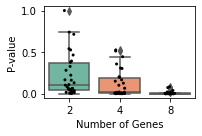

In [50]:
mg_2_pvals = [
    x['joint_p_value'] 
    for x in j_sim_mg_2_CALML5_cs_0_035_spotwise.values()
]
mg_4_pvals = [
    x['joint_p_value'] 
    for x in j_sim_mg_4_CALML5_cs_0_035_spotwise.values()
]
mg_8_pvals = [
    x['joint_p_value'] 
    for x in j_sim_mg_8_CALML5_cs_0_035_spotwise.values()
]

da = [
    (p_val, '2')
    for p_val in mg_2_pvals
]
da += [
    (p_val, '4')
    for p_val in mg_4_pvals
]
da += [
    (p_val, '8')
    for p_val in mg_8_pvals
]
plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Number of Genes']
)

figure, ax = plt.subplots(
    1, 
    1,
    figsize=(3,2)
)
sns.boxplot(data=plot_df, x='Number of Genes', y='P-value', ax=ax)
sns.stripplot(data=plot_df, x='Number of Genes', y='P-value', color='black', s=3, ax=ax)
plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/mult_genes_change_num_genes.pdf'), format='pdf', bbox_layout='tight')
plt.show()

## Comparison to sHOT

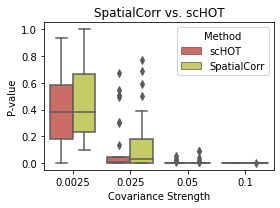

In [53]:
da = []
for elem in os.listdir(join(DATA_ROOT, 'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.0025')):
    fname = join(DATA_ROOT, f'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.0025/{elem}')
    df_schot = pd.read_csv(fname, sep='\t')
    p_val = df_schot.iloc[0]['pvalEstimated']
    da.append((p_val, 'scHOT', '0.0025'))
for elem in os.listdir(join(DATA_ROOT, 'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.025')):
    fname = join(DATA_ROOT, f'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.025/{elem}')
    df_schot = pd.read_csv(fname, sep='\t')
    p_val = df_schot.iloc[0]['pvalEstimated']
    da.append((p_val, 'scHOT', '0.025'))
for elem in os.listdir(join(DATA_ROOT, 'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.05')):
    fname = join(DATA_ROOT, f'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.05/{elem}')
    df_schot = pd.read_csv(fname, sep='\t')
    p_val = df_schot.iloc[0]['pvalEstimated']
    da.append((p_val, 'scHOT', '0.05'))
for elem in os.listdir(join(DATA_ROOT, 'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.1')):
    fname = join(DATA_ROOT, f'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.1/{elem}')
    df_schot = pd.read_csv(fname, sep='\t')
    p_val = df_schot.iloc[0]['pvalEstimated']
    da.append((p_val, 'scHOT', '0.1'))

da += [
    (p_val, 'SpatialCorr', '0.0025')
    for p_val in df_sim_sig_5_cs_0_0025_spotwise['p_value']
]
da += [
    (p_val, 'SpatialCorr', '0.025')
    for p_val in df_sim_sig_5_cs_0_025_spotwise['p_value']
]
da += [
    (p_val, 'SpatialCorr', '0.05')
    for p_val in df_sim_sig_5_cs_0_05_spotwise['p_value']
]
da += [
    (p_val, 'SpatialCorr', '0.1')
    for p_val in df_sim_sig_5_cs_0_1_spotwise['p_value']
]

plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Method', 'Covariance Strength']
)

sns.set_palette("hls")
fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3)
)
sns.boxplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Method', ax=ax)
ax.set_title('SpatialCorr vs. scHOT')
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/scHOT_vs_SpatialCorr_static_mean_change_cov_strength.pdf'), format='pdf')
plt.show()
sns.set_palette("Set2")

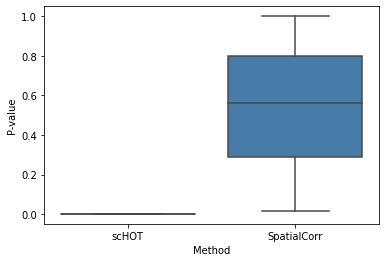

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/ipykernel_launcher.py:28: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_layout" which is no longer supported as of 3.3 and will become an error two minor releases later


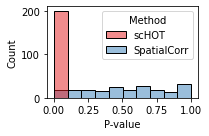

In [62]:
sns.set_palette("Set1")
schot_pvals = []
spacor_pvals = []
da = []
for elem in os.listdir(join(DATA_ROOT, 'scHOT/outs/config_static.corr.differ.means.2')):
    fname = join(DATA_ROOT, f'scHOT/outs/config_static.corr.differ.means.2/{elem}')
    df_schot = pd.read_csv(fname, sep='\t')
    p_val = df_schot.iloc[0]['pvalEstimated']
    da.append((p_val, 'scHOT'))
    schot_pvals.append(p_val)
for p_val in df_sim_diff_means_cs_0_0_spotwise_condition_v2['p_value']:
    da.append((p_val, 'SpatialCorr'))
    spacor_pvals.append(p_val)
plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Method']
)
sns.boxplot(data=plot_df, x='Method', y='P-value')
plt.show()

figure, ax = plt.subplots(
    1, 
    1,
    figsize=(3,2)
)
sns.histplot(data=plot_df, x='P-value', hue='Method', ax=ax)
plt.tight_layout()
plt.savefig(join(DATA_ROOT, '../simulate_data/figures/scHOT_vs_SpatialCorr_diff_means.pdf', format='pdf', bbox_layout='tight')
plt.show()
sns.set_palette("Set2")


### A toy figure for the paper

In [10]:
def toy_example_for_publication_V3(df, plot_spot, corrs, out_file, bc_to_neighs, condition=True, clust_key='cluster'):    
    
    #gs_kw = dict(width_ratios=[[4.67, 4.67], [4.67, 5.8]], height_ratios=[0.5, 0.5])
    fig, axarr = plt.subplots(2,2,figsize=(6, 6))#, gridspec_kw=gs_kw)
    
    df = df.copy()
    df['tissue'] = [1 for x in df.index]
    expr = np.array([
        df['dino_gene_1'],
        df['dino_gene_2']
    ])
    
    neighbs = set(bc_to_neighs[plot_spot])
    
    y = -1 * np.array(df['row'])
    x = df['col']
   
    # Gene 1 expression
    axarr[0][0].scatter(x,y,c=np.log2(expr[0]), cmap='viridis', s=4)
    axarr[0][0].set_title(r'Gene 1 expression')
    axarr[0][0].set_xticks([])
    axarr[0][0].set_yticks([])
    
    # Gene 2 expression
    axarr[0][1].scatter(x,y,c=np.log2(expr[1]), cmap='viridis', s=4)
    axarr[0][1].set_title(r'Gene 2 expression')
    axarr[0][1].set_xticks([])
    axarr[0][1].set_yticks([])
    
    # Plot neighborhood
    colors = []
    plot_inds = []
    for s_i, spot in enumerate(df.index):
        if spot == plot_spot:
            plot_inds.append(s_i)
            colors.append('red')
        elif spot in neighbs:
            plot_inds.append(s_i)
            colors.append('red')
    axarr[0][0].scatter(np.array(x)[plot_inds], np.array(y)[plot_inds],c=colors, s=5)
    #axarr[0][0].scatter(np.array(x)[plot_inds], np.array(y)[plot_inds], c=expr[0][plot_inds], cmap='viridis', s=4)
    axarr[0][1].scatter(np.array(x)[plot_inds], np.array(y)[plot_inds],c=colors, s=5)
    #axarr[0][1].scatter(np.array(x)[plot_inds], np.array(y)[plot_inds], c=expr[1][plot_inds], cmap='viridis', s=4)
    
    # Plot expression scatterplot
    sns.regplot(expr.T[plot_inds].T[0], expr.T[plot_inds].T[1], ax=axarr[1][0])
    axarr[1][0].set_xlabel('Gene 1 expression')
    axarr[1][0].set_ylabel('Gene 2 expression')
    axarr[1][0].set_title("Expression in\nhighlighted region")
    
    # Plot correlations
    im = axarr[1][1].scatter(x,y,c=corrs, cmap='RdBu_r', s=4, vmin=-1, vmax=1)
    fig.colorbar(im, ax=axarr[1][1], ticks=[-1, 0, 1])
    axarr[1][1].set_title('Estimated correlation')
    axarr[1][1].set_xticks([])
    axarr[1][1].set_yticks([])
    plt.tight_layout()
    plt.show()
    fig.savefig(out_file, format='pdf', bbox_inches='tight')

#est_corrs, keep_inds = estimate_correlation(
#    df_sim_data_diff_means_cs_0_0_spotwise_v2, 
#    sigma=5, 
#    condition=None
#);

est_corrs, keep_inds = spatialcorr.utils.compute_local_correlation(
    build_adata_from_sim_dataframe(
        df_sim_data_diff_means_cs_0_0_spotwise_v2
    ),
    'Gene 1',
    'Gene 2',
    kernel_matrix=None,
    row_key='row',
    col_key='col',
    condition=None,
    sigma=5,
    contrib_thresh=10
)

In [11]:
df = df_sim_data_diff_means_cs_0_0_spotwise_v2.iloc[keep_inds].copy()
df['tissue'] = [1 for x in df.index]
row_col_to_barcode = spatialcorr.utils.map_row_col_to_barcode(df)
print('Mapping each barcode to its neighbors...')
bc_to_neighs = spatialcorr.utils.compute_neighbors(
    df,
    row_col_to_barcode,
    rad=2,
    tissue_key='tissue',
    row_key='row',
    col_key='col'
)
print('done.')

Mapping each barcode to its neighbors...
done.


/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log2
/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in log2
/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


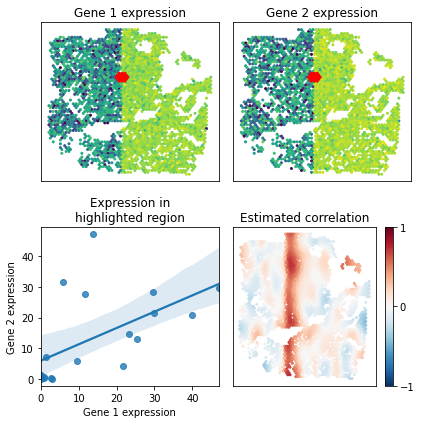

In [13]:
sns.set_palette("tab10")
toy_example_for_publication_V3(
    df_sim_data_diff_means_cs_0_0_spotwise_v2.iloc[keep_inds], 
    row_col_to_barcode[25][61], 
    est_corrs,
    join(DATA_ROOT, 'figures/toy_example_pitfalls_no_conditioning_Visium.pdf'),
    bc_to_neighs,
    condition=False, 
    clust_key=None
)
sns.set_palette("Set2")